# Housing Project

## Problem Statement

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

- Which variables are important to predict the price of variable?
- How do these variables describe the price of the house?

**Business Goal**

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

# `1. Training Dataset`

## Importing necessary libraries

In [88]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import zscore
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split as TTS
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import joblib

import warnings
warnings.filterwarnings('ignore')

## Loading the training dataset

In [2]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

In [3]:
train_df = pd.read_csv('train.csv')
train_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

**The dataset comprises a number of variables that we will use to forecast the housing prices. It includes both numerical and categorical data values. The target variable in this dataset is "SalePrice," which has continuous data values. Hence, it is a Regression Problem.**

**Categorical Nominal Data:**

- MSZoning: Identifies the general zoning classification of the sale.
- Street: Type of road access to property
- Alley: Type of alley access to property
- LotShape: General shape of property
- LandContour: Flatness of the property
- Utilities: Type of utilities available
- LotConfig: Lot configuration Categorical
- LandSlope: Slope of property Categorical
- Neighborhood: Physical locations within Ames city limits
- Condition1: Proximity to main road or railroad
- Condition2: Proximity to main road or railroad (if a second is present)
- BldgType: Type of dwelling
- HouseStyle: Style of dwelling
- RoofStyle: Type of roof
- RoofMatl: Roof material
- Exterior1st: Exterior covering on house
- Exterior2nd: Exterior covering on house (if more than one material)
- MasVnrType: Masonry veneer type
- Foundation: Type of foundation
- BsmtExposure: Walkout or garden level basement walls
- BsmtFinType1: Quality of basement finished area
- BsmtFinType2: Quality of second finished area (if present)
- Heating: Type of heating
- CentralAir: Central air conditioning
- Electrical: Electrical system
- Functional: Home functionality rating
- FireplaceQu: Fireplace quality
- GarageType: Garage location
- GarageFinish: Interior finish of the garage
- PavedDrive: Paved driveway
- PoolQC: Pool quality
- Fence: Fence quality
- MiscFeature: Miscellaneous feature not covered in other categories
- SaleType: Type of sale
- SaleCondition: Condition of sale

**Categorical Ordinal Data:**

- ExterQual: Exterior material quality
- ExterCond: Present condition of the material on the exterior
- BsmtQual: Height of the basement
- BsmtCond: General condition of the basement
- OverallQual: Overall material and finish quality
- OverallCond: Overall condition rating
- HeatingQC: Heating quality and condition
- KitchenQual: Kitchen quality
- GarageQual: Garage quality
- GarageCond: Garage condition

**Continuous Numerical Data:**

- SalePrice: The property's sale price in dollars
- LotFrontage: Linear feet of street connected to property
- LotArea: Lot size in square feet
- MasVnrArea: Masonry veneer area in square feet
- BsmtFinSF1: Type 1 finished square feet
- BsmtFinSF2: Type 2 finished square feet
- BsmtUnfSF: Unfinished square feet of basement area
- TotalBsmtSF: Total square feet of basement area
- 1stFlrSF: First Floor square feet
- 2ndFlrSF: Second floor square feet
- GrLivArea: Above grade (ground) living area square feet
- GarageArea: Size of garage in square feet
- WoodDeckSF: Wood deck area in square feet
- OpenPorchSF: Open porch area in square feet
- EnclosedPorch: Enclosed porch area in square feet
- ScreenPorch: Screen porch area in square feet
- YearBuilt: Original construction date
- YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)
- GarageYrBlt: Year garage was built
- YrSold: Year Sold

**Discrete Numerical Data:**

- MSSubClass: The building class
- LowQualFinSF: Low quality finished square feet (all floors)
- BsmtFullBath: Basement full bathrooms
- BsmtHalfBath: Basement half bathrooms
- FullBath: Full bathrooms above grade
- HalfBath: Half baths above grade
- TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)
- Fireplaces: Number of fireplaces
- GarageCars: Size of garage in car capacity
- 3SsnPorch: Three season porch area in square feet
- PoolArea: Pool area in square feet
- MiscVal: USD Value of miscellaneous feature
- MoSold: Month Sold

## EDA

In [4]:
train_df.shape

(1168, 81)

**SalePrice is the target variable that we need to predict for the purpose of this model.**

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

**The info above provides us with a summary of the list of columns, the number of non-null records in each column, along with their respective data types.**

In [7]:
train_df.nunique().to_frame("Count of Unique Values")

,Count of Unique Values
Id,1168
MSSubClass,15
MSZoning,5
LotFrontage,106
LotArea,892
Street,2
Alley,2
LotShape,4
LandContour,4
Utilities,1


**Findings:**
1. Id has all unique values since it is an identification number allotted to a house. Thus, we can drop the column.
2. Utilities has only 1 unique value, i.e. represeting all public utilities. Thus, we can drop the column.

In [8]:
train_df.drop("Id",axis=1,inplace=True)
train_df.drop("Utilities",axis=1,inplace=True)

In [9]:
# value counts of each record in each column
for i in train_df.columns:
    print(train_df[i].value_counts())
    print("\n")
    print("*"*50)
    print("\n")

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64


**************************************************


RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


**************************************************


60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
65.0      35
85.0      26
90.0      20
78.0      19
73.0      16
68.0      16
24.0      16
79.0      14
64.0      14
21.0      14
55.0      13
72.0      13
51.0      13
100.0     12
59.0      12
82.0      12
71.0      11
63.0      11
74.0      11
88.0      10
69.0      10
66.0      10
53.0      10
67.0       9
34.0       9
84.0       9
43.0       8
92.0       8
52.0       8
77.0       8
76.0       8
40.0       8
95.0       7
62.0       7
86.0       7
61.0       7
57.0       7
35.0       7
96.0       6
94.0       6
120.0

2006.0    52
2005.0    51
2007.0    40
2003.0    37
2004.0    36
1998.0    25
1977.0    24
1999.0    23
2002.0    23
2008.0    21
1993.0    20
1976.0    20
1957.0    18
2009.0    18
2001.0    18
2000.0    18
1968.0    18
1962.0    18
1950.0    18
1966.0    18
1997.0    17
1958.0    17
1965.0    17
1974.0    17
1995.0    17
1960.0    16
1994.0    15
1978.0    14
1970.0    14
1969.0    14
1990.0    14
1959.0    14
1954.0    14
1961.0    13
1996.0    13
1964.0    13
1963.0    13
1956.0    13
1980.0    12
1955.0    12
1971.0    12
1920.0    12
1988.0    12
1940.0    12
1979.0    11
1973.0    10
1967.0    10
1992.0    10
1981.0    10
1953.0     9
1972.0     9
1948.0     9
1985.0     9
1975.0     8
1989.0     8
1987.0     8
1925.0     7
1941.0     7
1983.0     7
1949.0     7
1991.0     7
1986.0     6
1930.0     6
1939.0     6
1951.0     5
1936.0     5
1946.0     4
1935.0     4
1926.0     4
1916.0     4
1984.0     4
1945.0     4
1982.0     3
1952.0     3
1931.0     3
1923.0     3
1910.0     3

In [10]:
zero_value = pd.DataFrame(train_df.isin([0]).sum().sort_values(ascending=False))
zero_value.columns = ['Count of Zero values']
zero_value['% of Zero Values']=zero_value['Count of Zero values']/11.68
zero_value

,Count of Zero values,% of Zero Values
PoolArea,1161,99.400685
3SsnPorch,1146,98.116438
LowQualFinSF,1145,98.030822
MiscVal,1126,96.404110
BsmtHalfBath,1105,94.606164
ScreenPorch,1073,91.866438
BsmtFinSF2,1032,88.356164
EnclosedPorch,999,85.530822
HalfBath,724,61.986301
MasVnrArea,692,59.246575


We can drop the columns with more than 85% values that are 0.

In [11]:
train_df.drop(columns = ['PoolArea',
                         '3SsnPorch',
                         'EnclosedPorch',
                         'LowQualFinSF',
                         'MiscVal',
                         'BsmtFinSF2',
                         'ScreenPorch',
                         'BsmtHalfBath'],inplace=True)

We can convert time variables into age by subtracting them from the year when the house was sold.

In [12]:
train_df['AgeBuilt'] = train_df.YrSold-train_df.YearBuilt
train_df['AgeRemodAdd'] = train_df.YrSold-train_df.YearRemodAdd
train_df['AgeGarageBlt'] = train_df.YrSold-train_df.GarageYrBlt

In [13]:
# Dropping YearBuilt, YearRemodAdd and GarageYrBlt as we have extracted the required value
train_df.drop("YearBuilt",axis=1,inplace=True)
train_df.drop("YearRemodAdd",axis=1,inplace=True)
train_df.drop("GarageYrBlt",axis=1,inplace=True)

In [15]:
train_df[['AgeBuilt','AgeRemodAdd','AgeGarageBlt']].head(10)

,AgeBuilt,AgeRemodAdd,AgeGarageBlt
0,31,31,30.0
1,37,37,37.0
2,11,10,10.0
3,33,33,33.0
4,32,9,32.0
5,0,0,0.0
6,53,14,53.0
7,49,6,49.0
8,42,42,42.0
9,61,58,61.0


In [16]:
# Skewness in training dataset before processing, normalization and cleaning of data
train_df.skew()

MSSubClass       1.422019
LotFrontage      2.450241
LotArea         10.659285
OverallQual      0.175082
OverallCond      0.580714
MasVnrArea       2.826173
BsmtFinSF1       1.871606
BsmtUnfSF        0.909057
TotalBsmtSF      1.744591
1stFlrSF         1.513707
2ndFlrSF         0.823479
GrLivArea        1.449952
BsmtFullBath     0.627106
FullBath         0.057809
HalfBath         0.656492
BedroomAbvGr     0.243855
KitchenAbvGr     4.365259
TotRmsAbvGrd     0.644657
Fireplaces       0.671966
GarageCars      -0.358556
GarageArea       0.189665
WoodDeckSF       1.504929
OpenPorchSF      2.410840
MoSold           0.220979
YrSold           0.115765
SalePrice        1.953878
AgeBuilt         0.573127
AgeRemodAdd      0.495051
AgeGarageBlt     0.635240
dtype: float64

In [17]:
train_null = pd.DataFrame(train_df[train_df.columns[train_df.isnull().any()]].isnull().sum())
train_null.columns=['Count of Null values']
train_null['% of Null Values']=train_null['Count of Null values']/11.68
train_null

,Count of Null values,% of Null Values
LotFrontage,214,18.321918
Alley,1091,93.407534
MasVnrType,7,0.599315
MasVnrArea,7,0.599315
BsmtQual,30,2.568493
BsmtCond,30,2.568493
BsmtExposure,31,2.654110
BsmtFinType1,30,2.568493
BsmtFinType2,31,2.654110
FireplaceQu,551,47.174658


**Majority of the records in "MiscFeature", "Fence", "PoolQC" and "Alley" are null values. Hence, there is no use filling these null values and it is better to drop the columns.**

In [18]:
train_df.drop(['PoolQC','MiscFeature','Alley','Fence'],axis=1,inplace=True)

In [19]:
train_df.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         7
MasVnrArea         7
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          30
BsmtCond          30
BsmtExposure      31
BsmtFinType1      30
BsmtFinSF1         0
BsmtFinType2      31
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
KitchenQual        0
TotRmsAbvGrd       0
Functional   

**Filling null values**
1. Numerical columns with null values - using mean
2. Categorical columns with null values - using mode

In [20]:
col2 = train_df.columns.values
for i in range(0,len(col2)):
    if train_df[col2[i]].dtype != 'object':
        train_df[col2[i]].fillna(train_df[col2[i]].mean(),inplace=True)

In [21]:
col1 = train_df.columns.values
for i in range(0,len(col1)):
    if train_df[col1[i]].dtype == "object":
        train_df[col1[i]].fillna(train_df[col1[i]].mode()[0],inplace=True)

In [22]:
train_df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageCars  

**All null values have been fixed. We can visualize the same using a heatmap.**

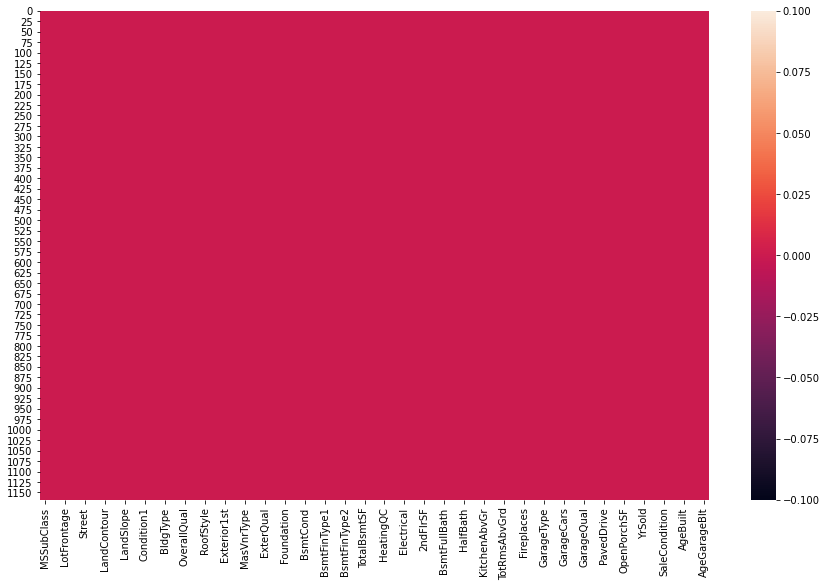

In [23]:
plt.figure(figsize=(15,9))
sns.heatmap(train_df.isnull())
plt.show()

In [24]:
train_df.shape

(1168, 67)

**`Separating Numerical and Categorical Coumns`**

In [25]:
categorical_col = []
for i in train_df.dtypes.index:
    if train_df.dtypes[i] == 'object':
        categorical_col.append(i)
print("Categorical columns are :",categorical_col)

Categorical columns are : ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [26]:
numerical_col = []
for i in train_df.dtypes.index:
    if train_df.dtypes[i] != 'object':
        numerical_col.append(i)
print("Categorical columns are :",numerical_col)

Categorical columns are : ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'SalePrice', 'AgeBuilt', 'AgeRemodAdd', 'AgeGarageBlt']


In [27]:
train_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice,AgeBuilt,AgeRemodAdd,AgeGarageBlt
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,102.310078,444.726027,569.721747,1061.095034,1169.860445,348.826199,1525.066781,0.425514,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1.776541,476.860445,96.206336,46.559932,6.344178,2007.804795,181477.005993,36.874144,23.046233,29.608696
std,41.940650,22.437056,8957.442311,1.390153,1.124343,182.047152,462.664785,449.375525,442.272249,391.161983,439.696370,528.042957,0.521615,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,0.745554,214.466769,126.158988,66.381023,2.686352,1.329738,79105.586863,30.193130,20.783486,24.247703
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000,0.000000,-1.000000,0.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,1143.250000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,338.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000,8.000000,4.000000,7.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,0.000000,385.500000,474.000000,1005.500000,1096.500000,0.000000,1468.500000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,24.000000,6.000000,2008.000000,163995.000000,36.000000,14.000000,29.608696
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,160.000000,714.500000,816.000000,1291.500000,1392.000000,729.000000,1795.000000,1.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,171.000000,70.000000,8.000000,2009.000000,215000.000000,54.000000,42.000000,46.250000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,12.000000,2010.000000,755000.000000,135.000000,60.000000,107.000000


**Findings:**
- there are no missing values present in the dataset.
- in some cases, mean > median (50%) implying right skew.
- in some cases, mean < median (50%) implying left skew.
- average sale price = AUD 181,477
- min sale price = AUD 34,900
- max sale price = 755,000
- on comparison between 75 percentile and max values, presence of outliers is evident
- the standard deviation in some columns is comparatively higher, implying higher dispersion.

## Data Visualization - Univariate Analysis

In [28]:
def value_count(column):
    counts=len(train_df[column].value_counts())
    if counts<3:
        plt.figure(figsize=(8,5))
    elif counts<5:
        plt.figure(figsize=(8,5))
        plt.xticks(rotation=90)
    elif counts<10:
        plt.figure(figsize=(10,6))
        plt.xticks(rotation=90)
    else:
        plt.figure(figsize=(10,8))
        plt.xticks(rotation=90)
    sns.countplot(x=column,data=train_df)
    plt.show()
    print("-"*100)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


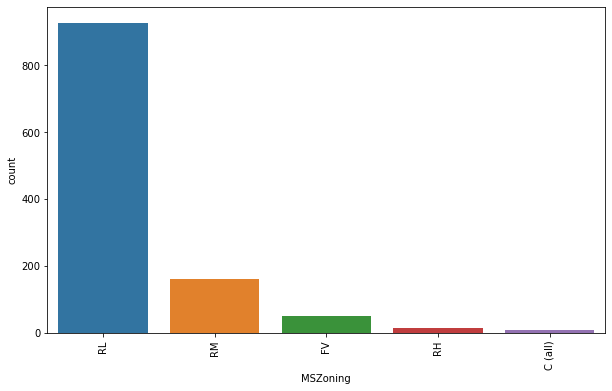

----------------------------------------------------------------------------------------------------
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


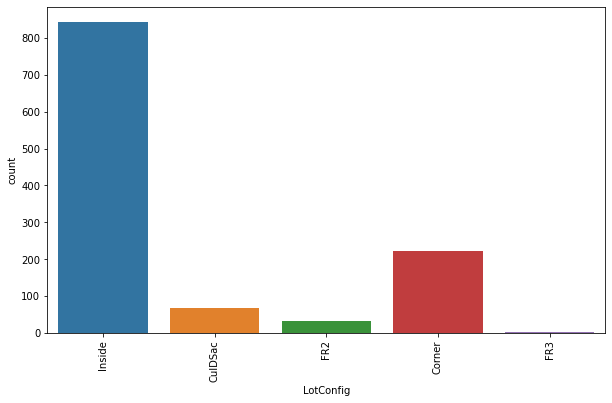

----------------------------------------------------------------------------------------------------
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
Veenker      9
MeadowV      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


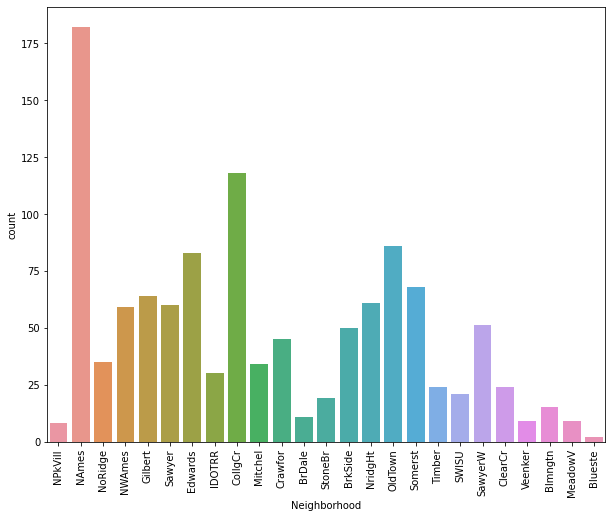

----------------------------------------------------------------------------------------------------
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


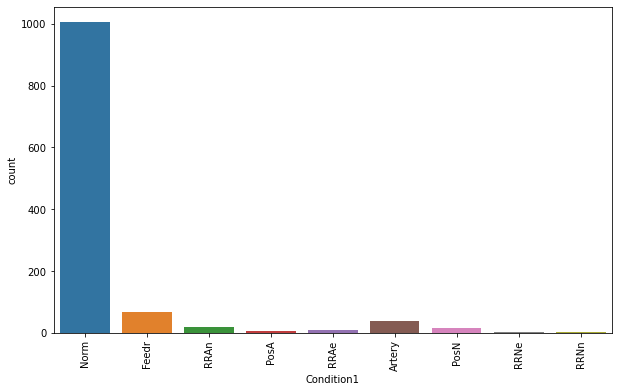

----------------------------------------------------------------------------------------------------
Norm      1154
Feedr        6
PosN         2
Artery       2
RRAn         1
RRNn         1
RRAe         1
PosA         1
Name: Condition2, dtype: int64


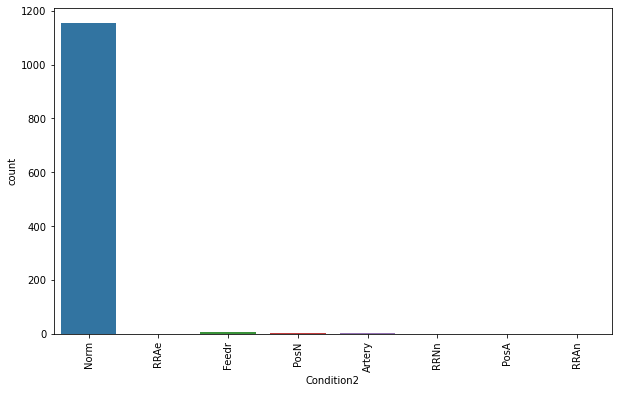

----------------------------------------------------------------------------------------------------
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


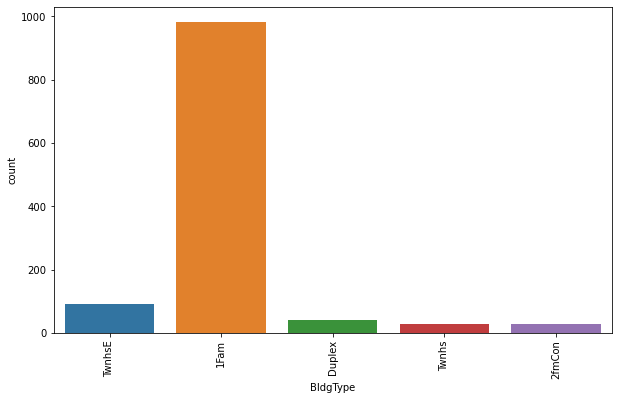

----------------------------------------------------------------------------------------------------
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


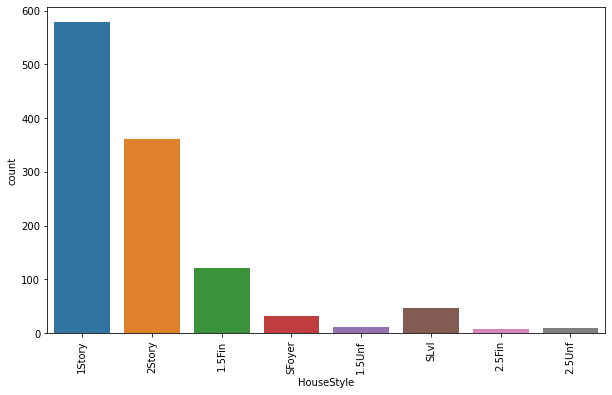

----------------------------------------------------------------------------------------------------
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


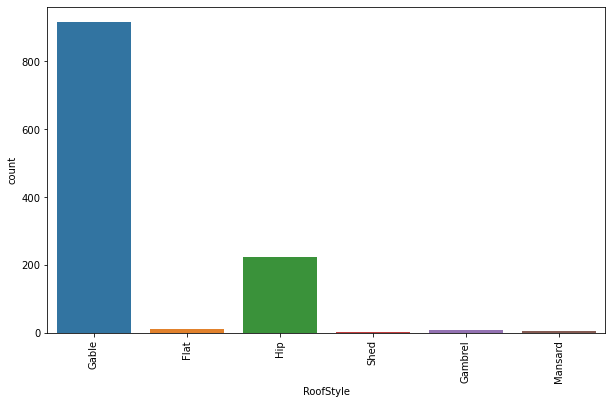

----------------------------------------------------------------------------------------------------
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
Membran       1
Metal         1
ClyTile       1
Name: RoofMatl, dtype: int64


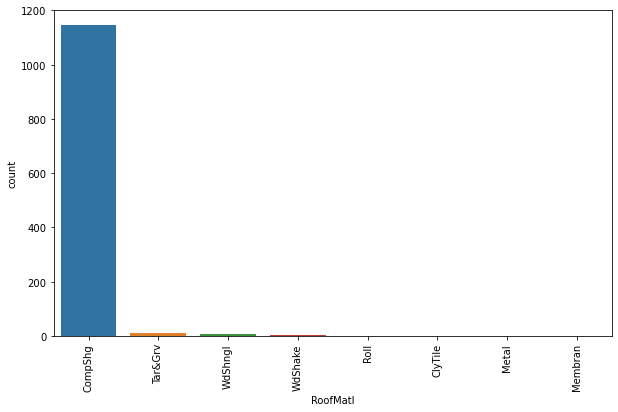

----------------------------------------------------------------------------------------------------
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
BrkComm      1
ImStucc      1
AsphShn      1
Name: Exterior1st, dtype: int64


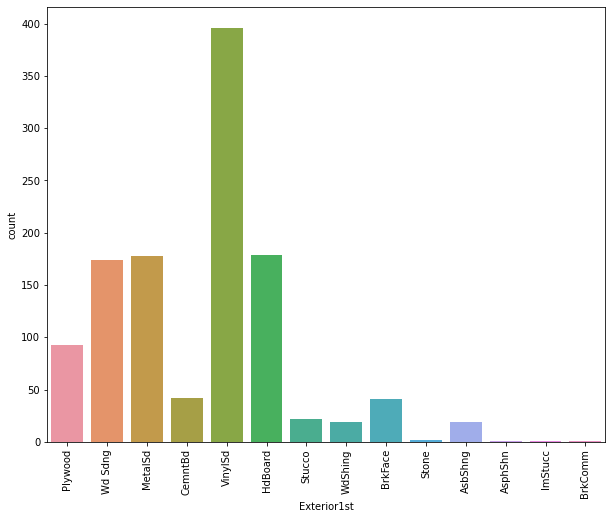

----------------------------------------------------------------------------------------------------
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


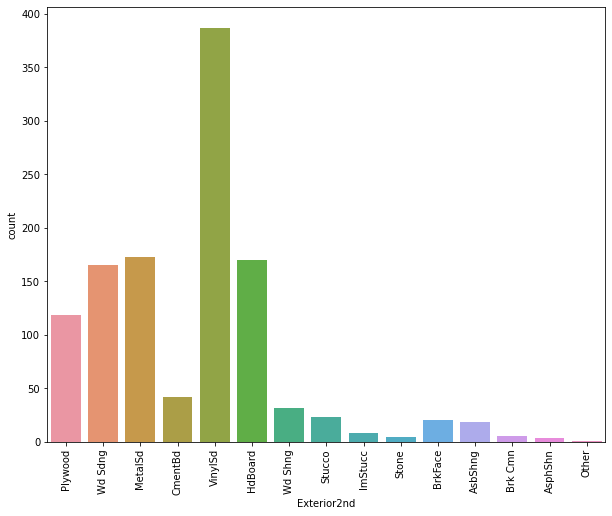

----------------------------------------------------------------------------------------------------
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


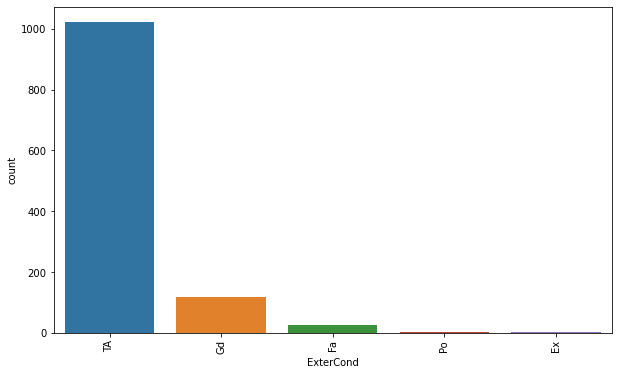

----------------------------------------------------------------------------------------------------
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


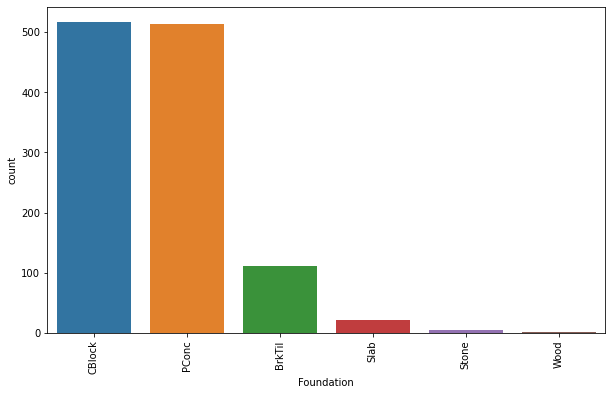

----------------------------------------------------------------------------------------------------
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


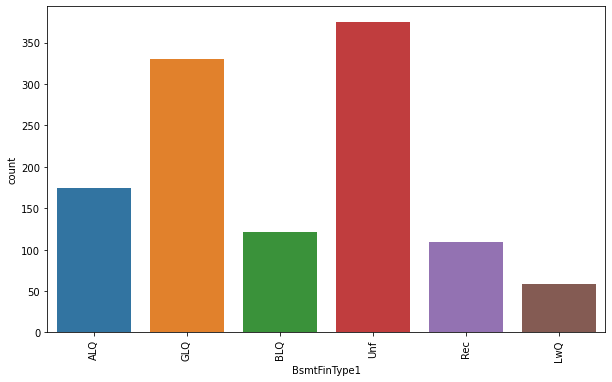

----------------------------------------------------------------------------------------------------
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


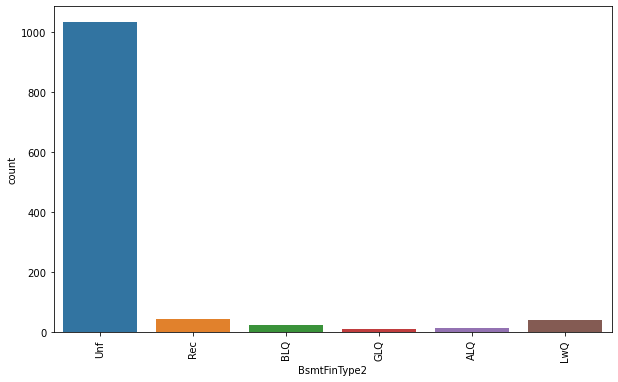

----------------------------------------------------------------------------------------------------
GasA     1143
GasW       14
Grav        5
Wall        4
OthW        1
Floor       1
Name: Heating, dtype: int64


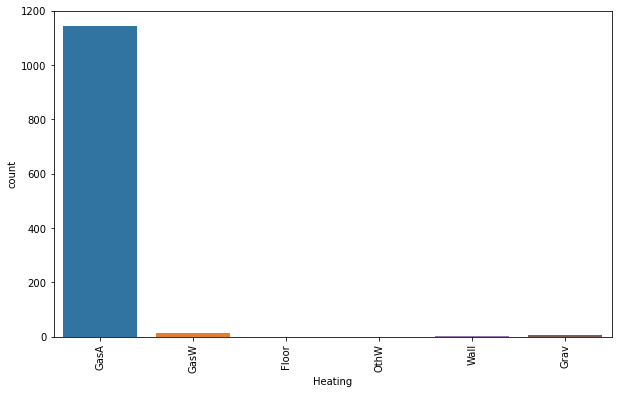

----------------------------------------------------------------------------------------------------
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


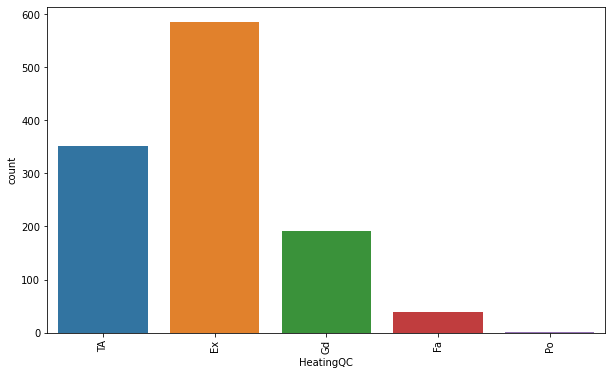

----------------------------------------------------------------------------------------------------
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


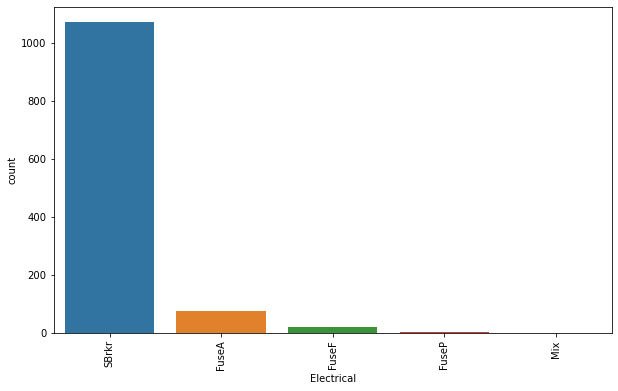

----------------------------------------------------------------------------------------------------
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


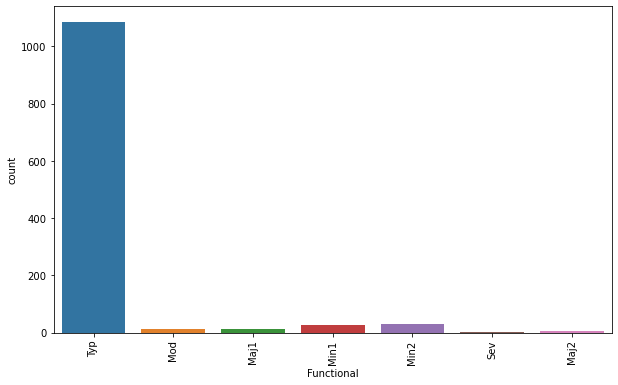

----------------------------------------------------------------------------------------------------
Gd    852
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64


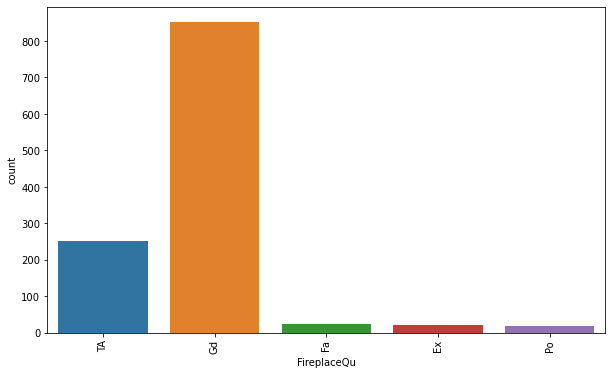

----------------------------------------------------------------------------------------------------
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


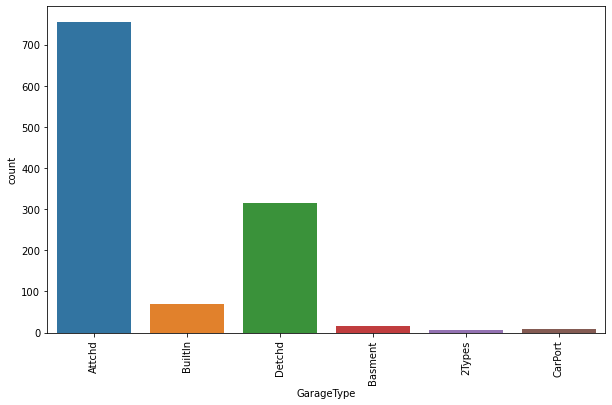

----------------------------------------------------------------------------------------------------
TA    1114
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64


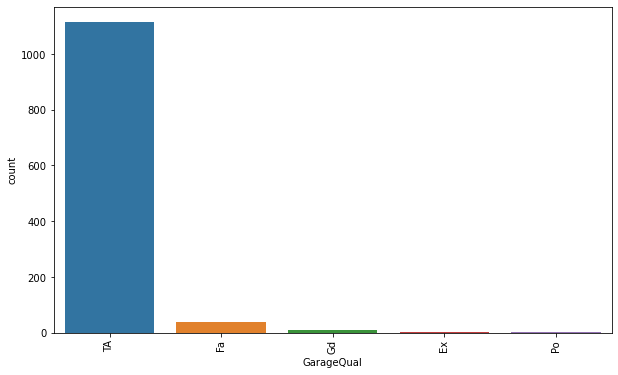

----------------------------------------------------------------------------------------------------
TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


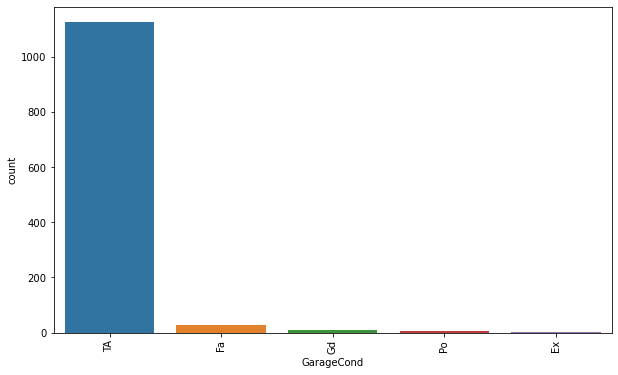

----------------------------------------------------------------------------------------------------
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
CWD        3
Oth        3
Con        2
Name: SaleType, dtype: int64


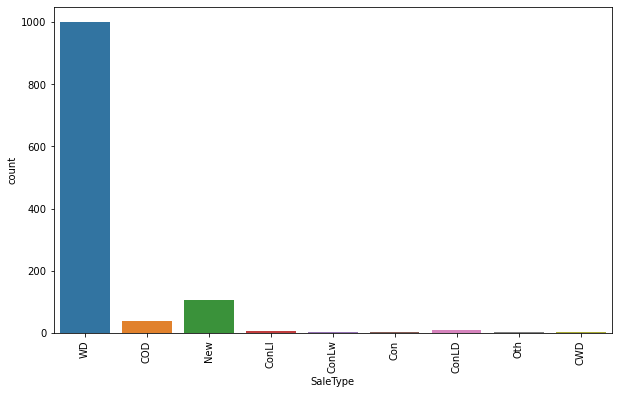

----------------------------------------------------------------------------------------------------
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


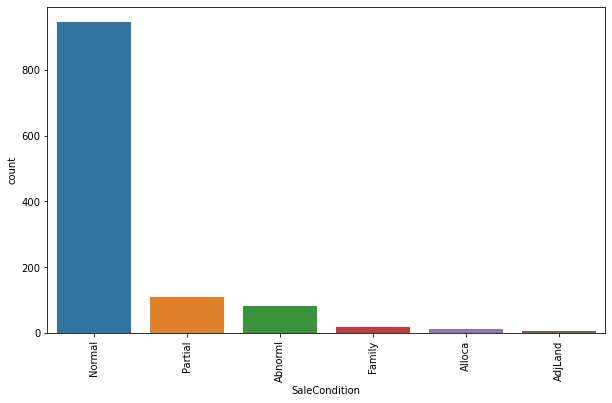

----------------------------------------------------------------------------------------------------


In [29]:
df1 = train_df[['MSZoning',
                'LotConfig',  
                'Neighborhood', 
                'Condition1', 
                'Condition2', 
                'BldgType', 
                'HouseStyle', 
                'RoofStyle', 
                'RoofMatl', 
                'Exterior1st', 
                'Exterior2nd',  
                'ExterCond', 
                'Foundation',
                'BsmtFinType1', 
                'BsmtFinType2', 
                'Heating', 
                'HeatingQC',  
                'Electrical',  
                'Functional', 
                'FireplaceQu', 
                'GarageType',  
                'GarageQual', 
                'GarageCond', 
                'SaleType', 
                'SaleCondition']]
for i in df1:
    print(df1[i].value_counts())
    value_count(i)

**Findings:**

- `MSZoning:` In the general zoning classification of the sale, Residential Low Density has the highest numbers, followed by Residential Medium Density, with Commercial classification having the lowest numbers of houses sold.
- `LotConfig:` Inside lot configuration has the highest numbers, followed by corner lots and Cul-de-sacs. Houses with Frontage on 3 sides of property have the lowest numbers.
- `Neighborhood:` North Ames has the highest numbers, followed by College Creek, Old Town and Edwards. Northpark Villa, Briardale, Veenker, Meadow Village and Bluestem have the lowest numbers in houses sold.
- `Condition1:` In terms of proximity to various conditions, Normal has the highest numbers, with all other conditions having very low numbers.
- `Condition2:` Same as in Condition1
- `BldgType:` Single-family Detached type of dwelling has the highest numbers in houses sold, with all other types having comparatively lower numbers.
- `HouseStyle:` One story styled dwelling have the highest numbers, followed by Two story, One and one-half story: 2nd level finished, and Split Level. All other styles of dwelling have lower numbers.
- `RoofStyle:` Gable type roof have the highest numbers, followed by comparatively low numbers of Hip style roofs, with very numbers of other styled roofs.
- `RoofMatl:` Roof of most houses have Standard (Composite) Shingle material
- `Exterior1st:` In terms of Exterior covering on house, Vinyl Siding is the highest in number, followed by Hard Board, Metal Siding and Wood Siding.
- `ExterCond:` The present condition of the material on the exterior is Typical in most cases, good and fair in the remaining, with some exceptions of Excellent and Poor.
- `Foundation:` Cinder Block and Poured Contrete have almost equal numbers, followed by Brick & Tile type of foundation.
- `BsmtFinType1:` The basement finished area of most houses are rated Unfinshed or Good Living Quarters, followed by Average Living Quarters, Below Average Living Quarters, Average Rec Room, Low Quality respectively.
- `Heating:` Most houses have Gas forced warm air furnace
- `HeatingQC:` In terms of Heating quality and condition, most houses have a rating of Excellent, followed by either typical/average, or Good.
- `Electrical:` Most homes have Standard Circuit Breakers & Romex in terms of electrical systems installed
- `Functional:` In terms of Home functionality, most homes have a Typical Functionality, with few numbers having minor to moderate deductions, 15 homes with major deductions, and 1 with severe damage.
- `FireplaceQu:` Most homes have Good or Average Fireplace Quality
- `GarageType:` Garages in most homes are attached, followed by houses having detached garages
- `SaleType:` The sale of most houses was through a conventional warranty deed, followed by homes that were recently constructed and sold
- `SaleCondition:` Most homes had normal conditions of sale, followed by comparatively low numbers of homes which were not completed when last assessed, and abnormal sales through trade, foreclosure or short sale.

Pie plot for the column: Street
Pave    1164
Grvl       4
Name: Street, dtype: int64


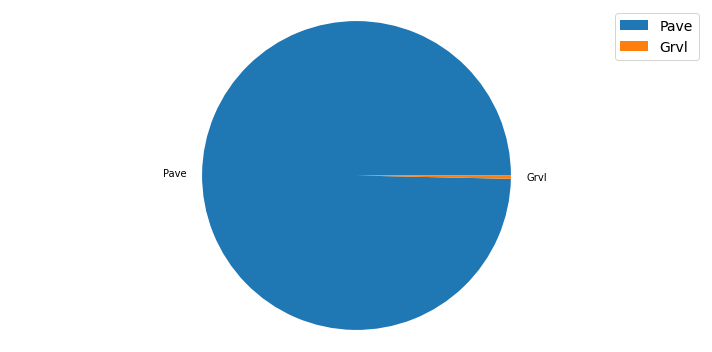

----------------------------------------------------------------------------------------------------
Pie plot for the column: LotShape
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


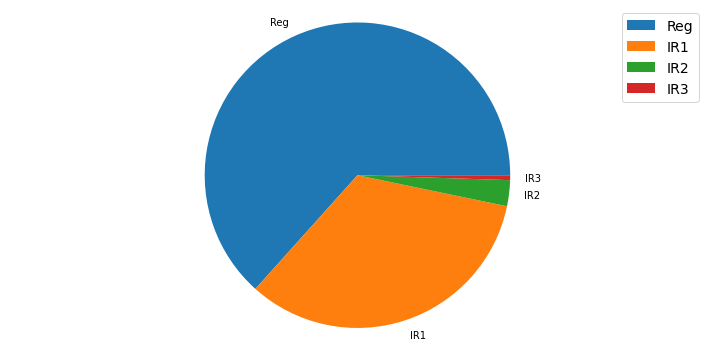

----------------------------------------------------------------------------------------------------
Pie plot for the column: LandContour
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


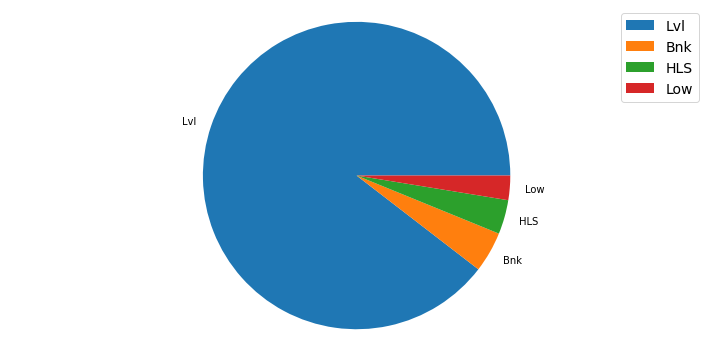

----------------------------------------------------------------------------------------------------
Pie plot for the column: LandSlope
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


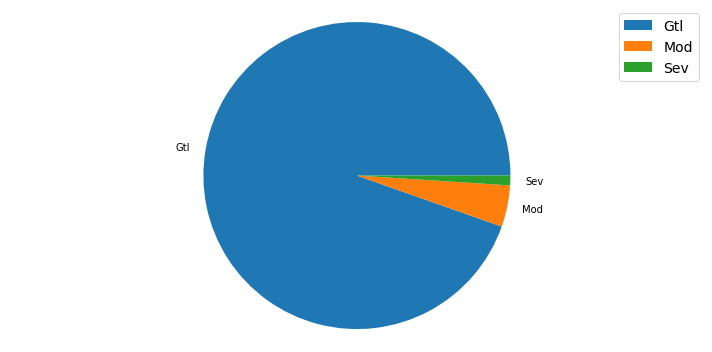

----------------------------------------------------------------------------------------------------
Pie plot for the column: MasVnrType
None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


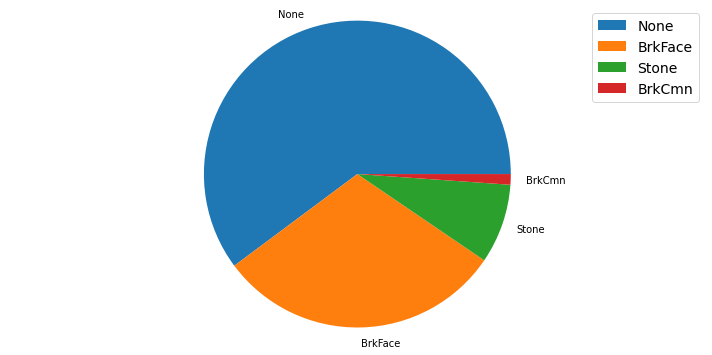

----------------------------------------------------------------------------------------------------
Pie plot for the column: ExterQual
TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


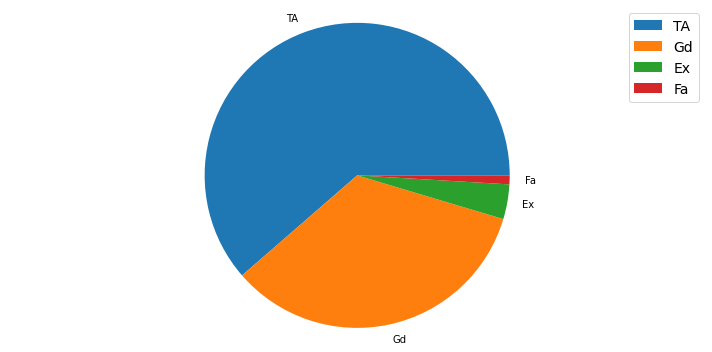

----------------------------------------------------------------------------------------------------
Pie plot for the column: BsmtQual
TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


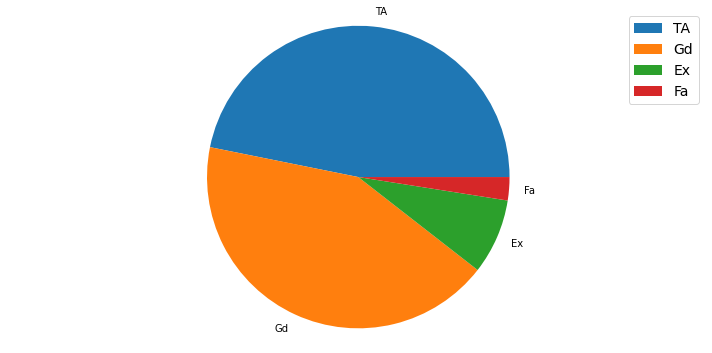

----------------------------------------------------------------------------------------------------
Pie plot for the column: BsmtCond
TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


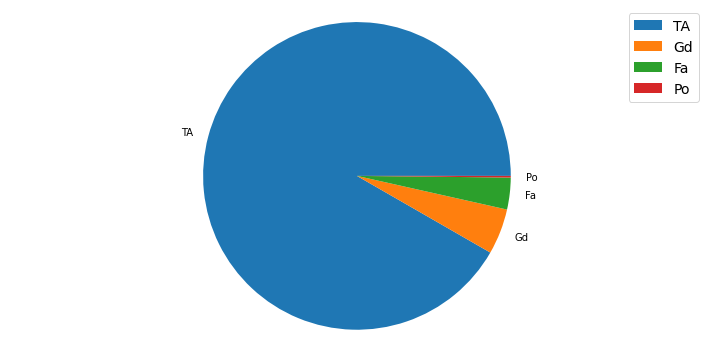

----------------------------------------------------------------------------------------------------
Pie plot for the column: BsmtExposure
No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


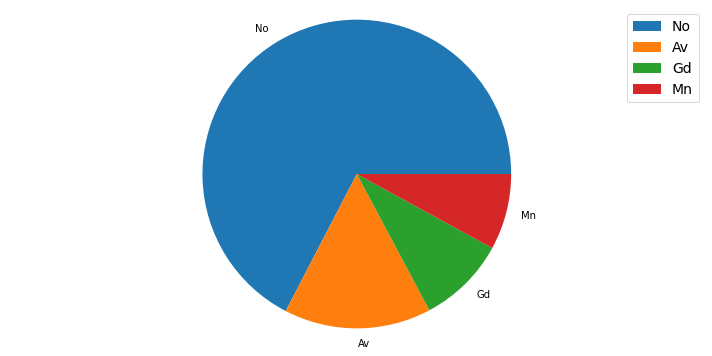

----------------------------------------------------------------------------------------------------
Pie plot for the column: CentralAir
Y    1090
N      78
Name: CentralAir, dtype: int64


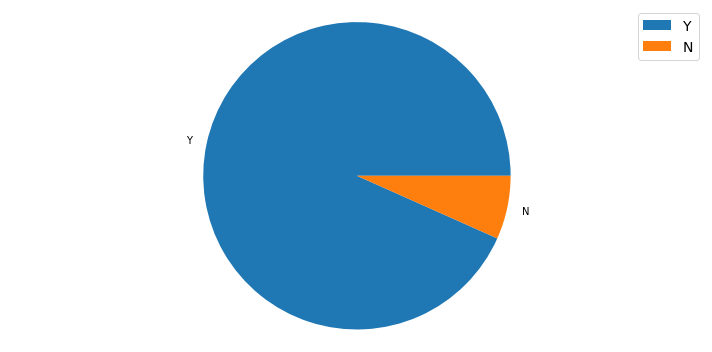

----------------------------------------------------------------------------------------------------
Pie plot for the column: KitchenQual
TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


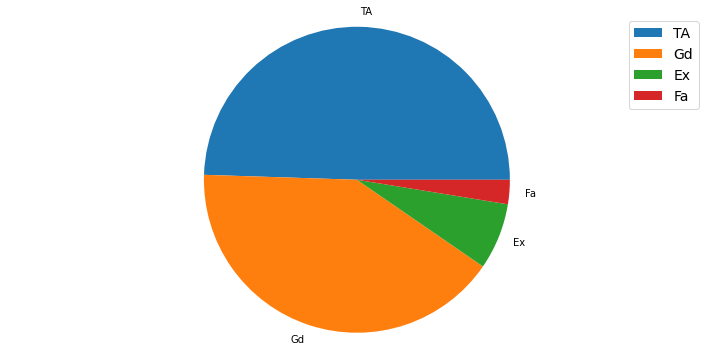

----------------------------------------------------------------------------------------------------
Pie plot for the column: GarageFinish
Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


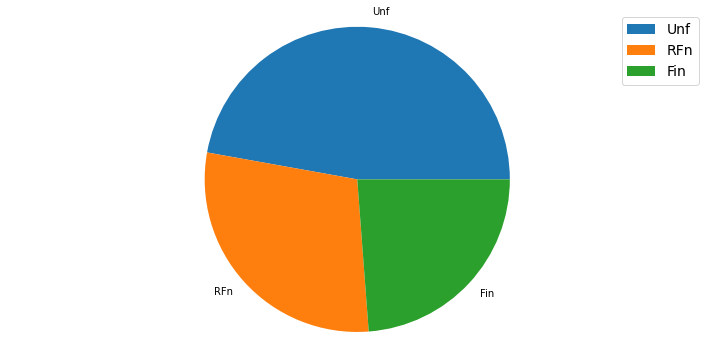

----------------------------------------------------------------------------------------------------
Pie plot for the column: PavedDrive
Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


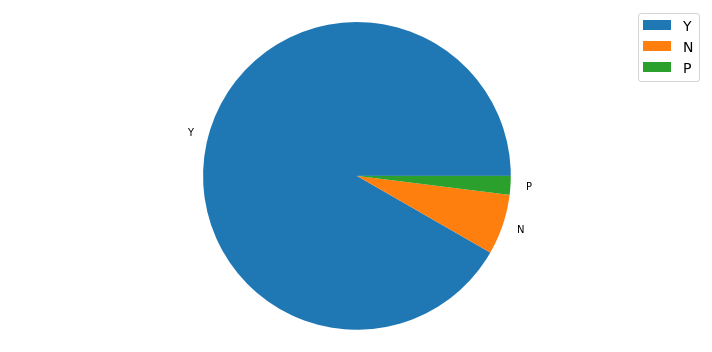

----------------------------------------------------------------------------------------------------


In [30]:
def pie_plot(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(),labels=i.value_counts().index)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

cols1 = ['Street', 
         'LotShape',
         'LandContour',
         'LandSlope', 
         'MasVnrType',
         'ExterQual',
         'BsmtQual',
         'BsmtCond',
         'BsmtExposure',
         'CentralAir',
         'KitchenQual',
         'GarageFinish',
         'PavedDrive']

plotnumber=1
for j in train_df[cols1]:
    print(f"Pie plot for the column:", j)
    print(train_df[j].value_counts())
    pie_plot(train_df[j])
    print("-"*100)

**Findings:**
- `Street:` Most houses have a paved road access to the property
- `LotShape:` Most properties have a regular shape, followed by those that are slightly irregular. There are few properties that are moderately or completely irregular
- `LandContour:` Most properties have Near Flat or Levelled land contour
- `MasVnrType:` Although most homes have no masonry veneers, there are quite a few that have a brick face veneer, followed by stone or brick commons.
- `BsmtExposure:` Most homes have no exposure to walkout or garden level walls, followed by those with average exposure, good exposure and minimum exposure.
- `CentralAir:` Almost all homes have central air conditioning
- `KitchenQual:` Most homes in the dataset have either an average/typical or good kitchen quality
- `GarageFinish:` The interior finish of garages in most homes is unfinished, followed by those with a rough finish, or are completely finished.

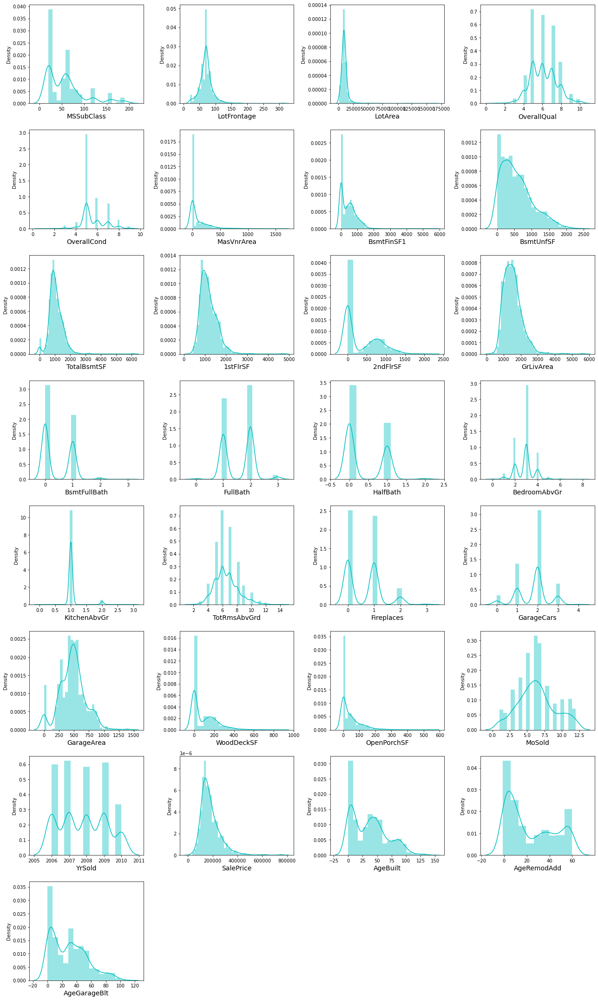

In [31]:
# data distribution
plt.figure(figsize=(18,30))
plotnumber=1
for column in numerical_col:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(train_df[column],color="c")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

**The records in most columns are not normally distributed, with almost every column having skewness.**

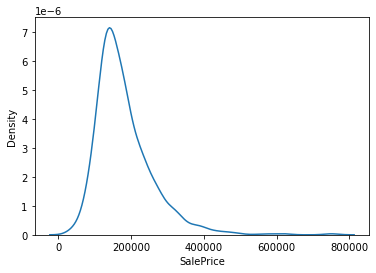

In [33]:
plt.figure(figsize=(6,4))
sns.distplot(train_df['SalePrice'],hist=False)
plt.show()

**Sale Price is almost normally distributed, with some skeweness.**

## Data Visualization - Bivariate Analysis

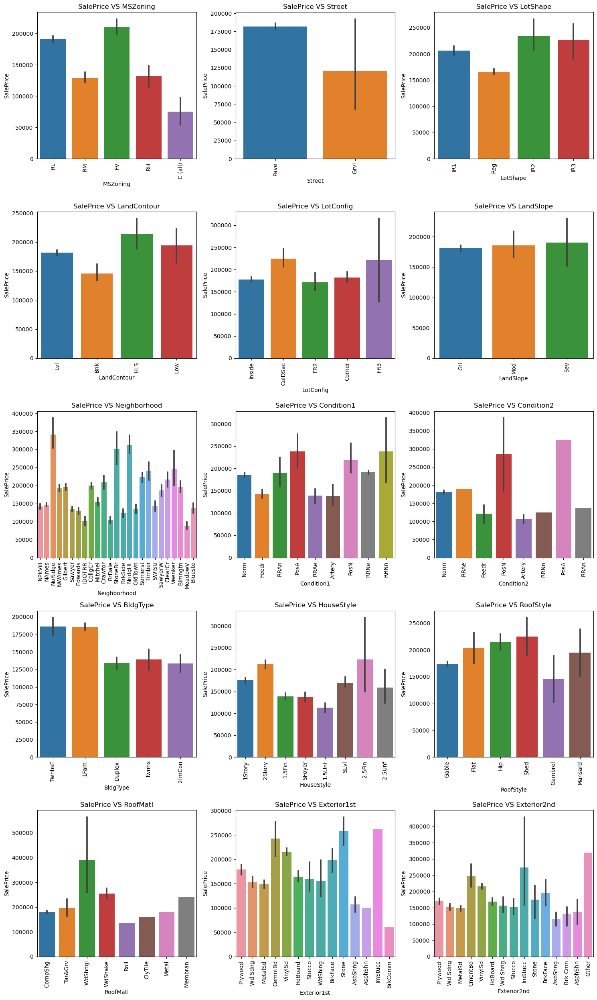

In [34]:
nominal_data1 = ['MSZoning',
                 'Street',
                 'LotShape',
                 'LandContour',
                 'LotConfig',
                 'LandSlope',
                 'Neighborhood',
                 'Condition1',
                 'Condition2',
                 'BldgType',
                 'HouseStyle',
                 'RoofStyle',
                 'RoofMatl',
                 'Exterior1st',
                 'Exterior2nd']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nominal_data1)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[nominal_data1[i]])
    plt.title(f"SalePrice VS {nominal_data1[i]}",fontsize=12)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

**Findings:**
- Floating Village Residential have the highest sale prices, followed by Residential Low Density. Residential Medium Density and Residential High Density are similar in terms of highest prices, finally followed by Commercial properties.
- Properties with Paved road access to property have higher sale prices
- Sale prices for regularly shaped properties are lower as compared to irregularly shaped properties.
- Hillside properties are sold at higher prices, compared to banked, depressed or near flat properties
- Properties with frontage on 3 sides have highest prices, with cul de sacs having higher sale prices in general.
- Properties have similar sale pricing irrespective of slope of the property
- Houses in the neighborhoods of Northridge, Stone Brook and Northridge Heights have higher sale prices, while the neighborhoods of Iowa DOT and Rail Road, Briardale and Meadow Villagehave sale prices on the lower end of the price spectrum.
- Houses within 200' of North-South Railroad and those Adjacent to postive off-site feature have higher sale prices, combined with secondary conditions of Near positive off-site feature--park, greenbelt, etc., or Adjacent to postive off-site feature also have higher sale prices.
- Townhouse End Units and Single-family Detached dwellings have similar and high sale prices, followed by similar pricing for Townhouse Inside Units, Duplex and Two-family Conversion units.
- Two and one-half story: 2nd level finished has the highest sale pricing, followed by Two story houses.
- The houses having the roof style Flat, Hip and Shed have high sale price and the houses having gabrel roof style have less sale price.
- Houses with Wood Shingles root materials have high sale prices.
-  Houses having Imitation Stucco, Stone and Cement Board as 1st exterior cover have high sale price.
- Houses having Imitation Stucco and other as 2nd cover have high sale price.

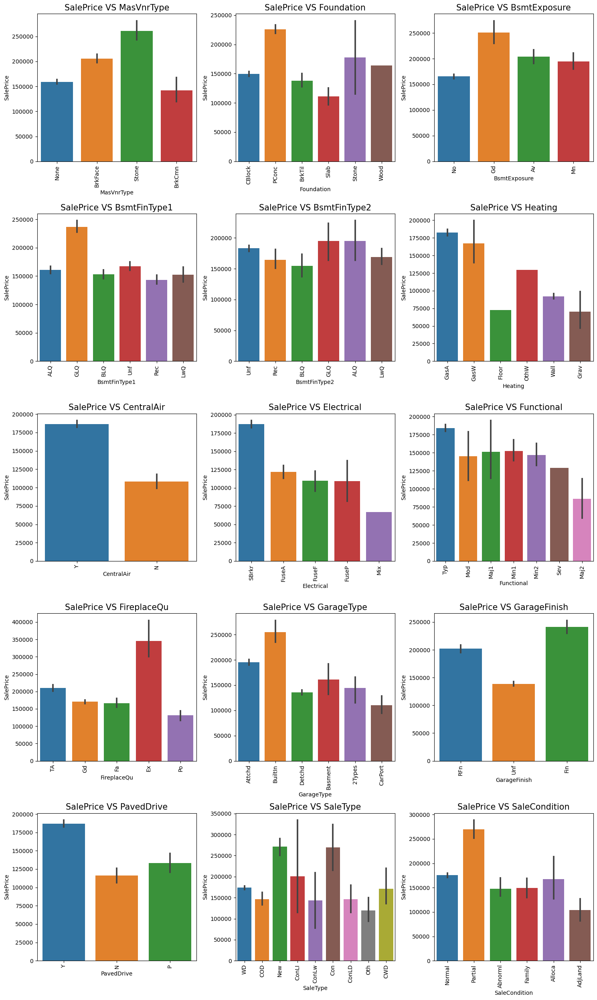

In [35]:
nominal_data2 = ['MasVnrType',
                 'Foundation',
                 'BsmtExposure',
                 'BsmtFinType1',
                 'BsmtFinType2',
                 'Heating',
                 'CentralAir',
                 'Electrical',
                 'Functional',
                 'FireplaceQu',
                 'GarageType',
                 'GarageFinish',
                 'PavedDrive',
                 'SaleType',
                 'SaleCondition']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nominal_data2)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[nominal_data2[i]])
    plt.title(f"SalePrice VS {nominal_data2[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

**Findings:**
- Homes with Stone masonry veneers have highest prices, followed by those with Brick Face. Houses with no masonry veneers and those with brick commons have similar sale prices.
- Poured concrete foundation houses have higher sale prices, followed by houses having Stone foundations, which in some instances have been sold at prices almost as high as houses with pured concrete foundations. This is followed by houses with wood, cinder block, brick and tile, and slab foundations.
- Properties with good exposure to walkout or garden level walls have the highest sale prices.
- Homes with Good Living Quarters finishing rating for basements have the highest prices, followed by all other categories, which are at almost similar sale prices.
- Sale prices are the highest for homes with Gas forced warm air furnace and Gas hot water or steam heat heating systems. 
- Centrally air conditioned homes have higher sale prices as compared to those that do not.
- In terms of electrical systems, homes with Standard Circuit Breakers & Romex have the highest sale prices, while those with mixed electrical systems are priced the lowest in comparison.
- Sale prices are the highest for homes with typical functionality, followed by a variable pricing for other categories of home functionality.
- Sale prices are by far the highest for homes with excellent fire place quality
- Houses with built-in garages are priced the highest, followed by those with attached garages, and basement garages.
- From the plot, it is clearly evident as expected that homes with finished garages have the highest prices, followed by roughly finished and finally with unfinished garages.
- Homes with a paved driveway have the highest sale prices, as expected, followed by those with partial pavements.
- Properties sold with contracts with low interest have witnessed highest sale prices in on off instances, however, in general, homes sold with Contract 15% Down payment regular terms, and Homes just constructed and sold have the highest sale prices.
- Home that were not completed when last assessed (i.e. primarily new homes) saw the highest sale prices.

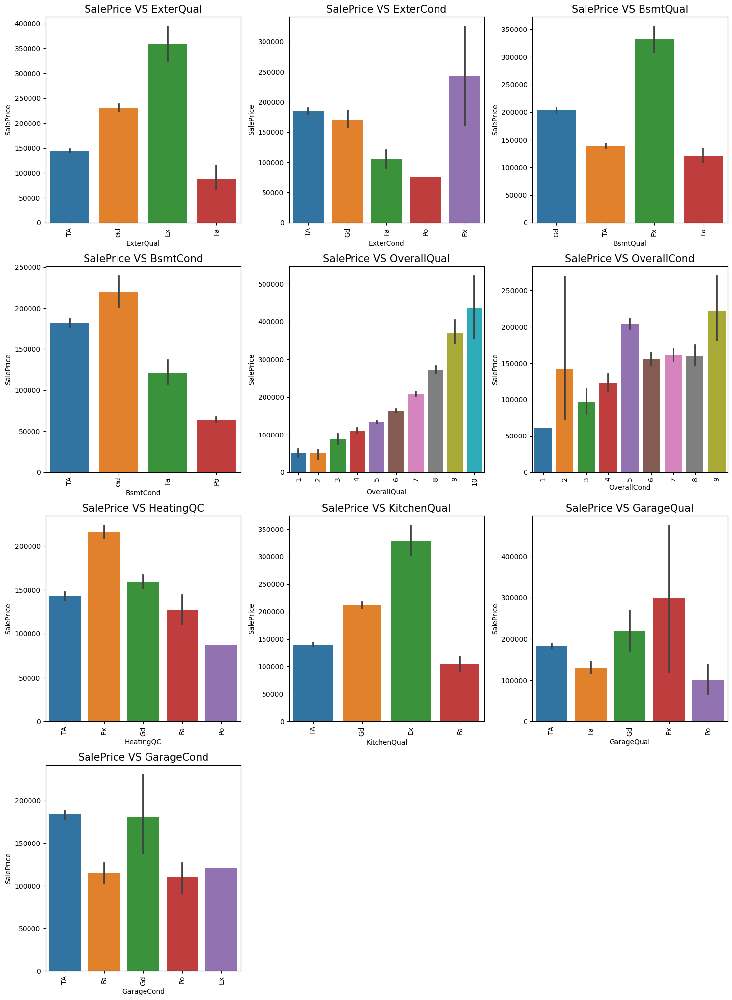

In [36]:
ordinal_data = ['ExterQual',
                'ExterCond',
                'BsmtQual',
                'BsmtCond',
                'OverallQual',
                'OverallCond',
                'HeatingQC',
                'KitchenQual',
                'GarageQual',
                'GarageCond']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(ordinal_data)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[ordinal_data[i]])
    plt.title(f"SalePrice VS {ordinal_data[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

**Findings:**
- Sale pricing of houses increases with an increase in the exterior quality rating of the house, with excellent rated houses fetching the highest prices, followed by those rated as Good, Average and Poor.
- Exterior condition of the house records a similar trend as in the case with exterior quality of the house.
- In terms of basement quality, i.e. the height of the basement, those rated excellent (100+ inches) fetch highest sale prices in the housing market.
- General condition of the basement is directly related to the sale price of the house, with houses having better condition basements fetching prices in the market.
- Overall quality of the house experiences a linear relationship with the sale price of the house, with price increasing with each higher rating of the house.
- Ratings on the overall condition of the house does not experience a linear relationship with the sale pricing of the house. The highest pricing going for those rated 9 (no data for houses rated 10), followed by those rated 5, and some instances of those rated 2, but 8,7, and 6 in general.
- An excellent heating quality and condition rating fetches highest sale prices, followed by Good, typical, fair and poor rated houses respectively.
- Garage Condition rating of Good sees highest sale prices in the market, followed by typical/average rated garages of houses, with Excellent, Fair and Poor rated ones experiencing similar pricing levels.

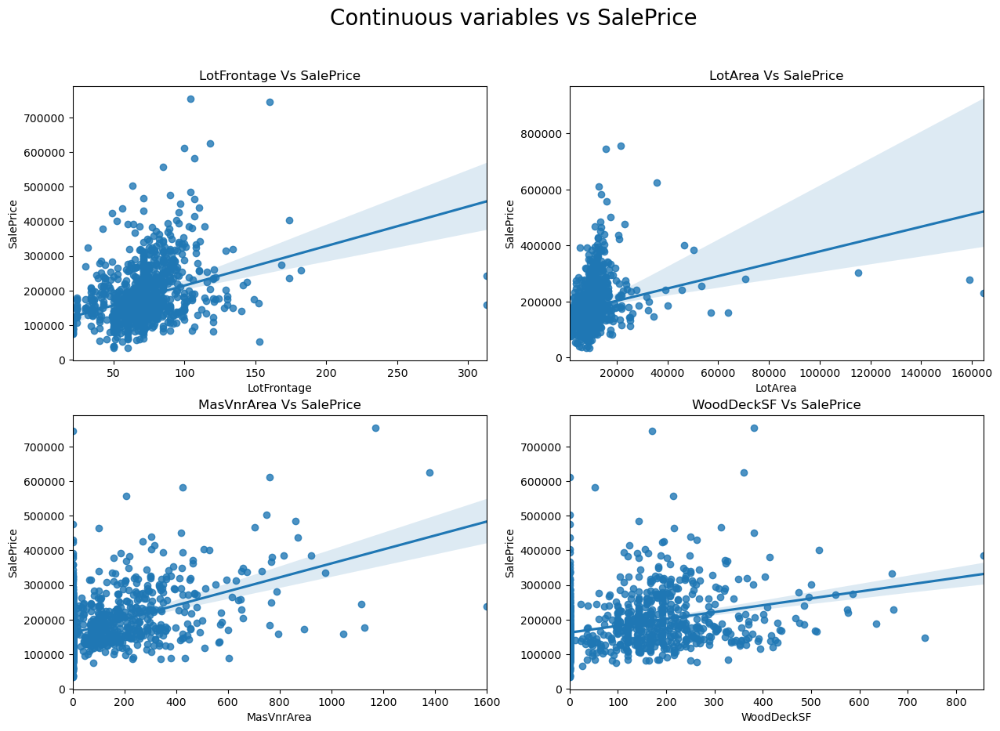

In [38]:
plt.figure(figsize=(15,10))
plt.suptitle("Continuous variables vs SalePrice",fontsize=20)

plt.subplot(2,2,1)
plt.title("LotFrontage Vs SalePrice")
sns.regplot(x = 'LotFrontage', y = 'SalePrice',data = train_df)

plt.subplot(2,2,2)
plt.title("LotArea Vs SalePrice")
sns.regplot(x = 'LotArea', y = 'SalePrice',data = train_df)

plt.subplot(2,2,3)
plt.title("MasVnrArea Vs SalePrice")
sns.regplot(x = 'MasVnrArea', y = 'SalePrice',data = train_df)

plt.subplot(2,2,4)
plt.title("WoodDeckSF Vs SalePrice")
sns.regplot(x = 'WoodDeckSF', y = 'SalePrice',data = train_df)
plt.show()

   **We can see a weak and positive relationship between sale price and LotArea, MasVnrArea and WoodDeckSF respectively. Sale prices increase invariably as the the aforementioned variables increase in values.**

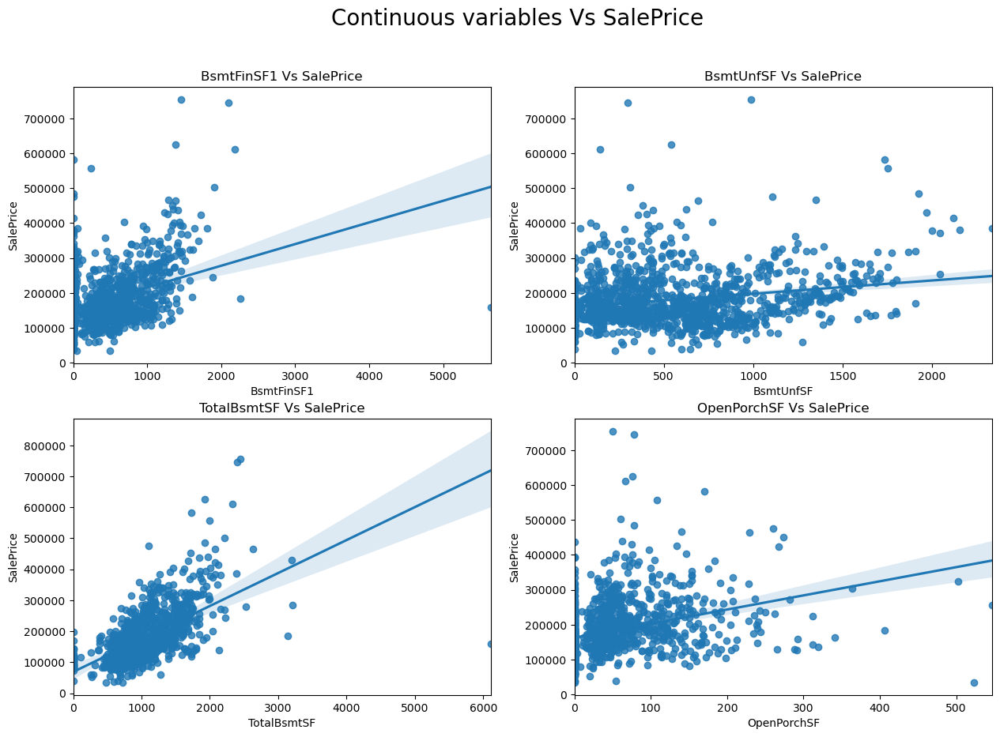

In [39]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFinSF1 Vs SalePrice')
sns.regplot(x='BsmtFinSF1',y='SalePrice',data=train_df)

plt.subplot(2,2,2)
plt.title('BsmtUnfSF Vs SalePrice')
sns.regplot(x='BsmtUnfSF',y='SalePrice',data=train_df)

plt.subplot(2,2,3)
plt.title('TotalBsmtSF Vs SalePrice')
sns.regplot(x='TotalBsmtSF',y='SalePrice',data=train_df)

plt.subplot(2,2,4)
plt.title('OpenPorchSF Vs SalePrice')
sns.regplot(x='OpenPorchSF',y='SalePrice',data=train_df)
plt.show()

**There is a clear positive linear relationship between Sale Price and the variables. The sale price is high that is 100000-300000 when basement square feet lie upto 1500 square feet. When the unfinished basement area is below 1000 square feet, the sale price is high. As total basement area increases, sale price also increases. The sale price is high when Open porch area is below 200sf.**

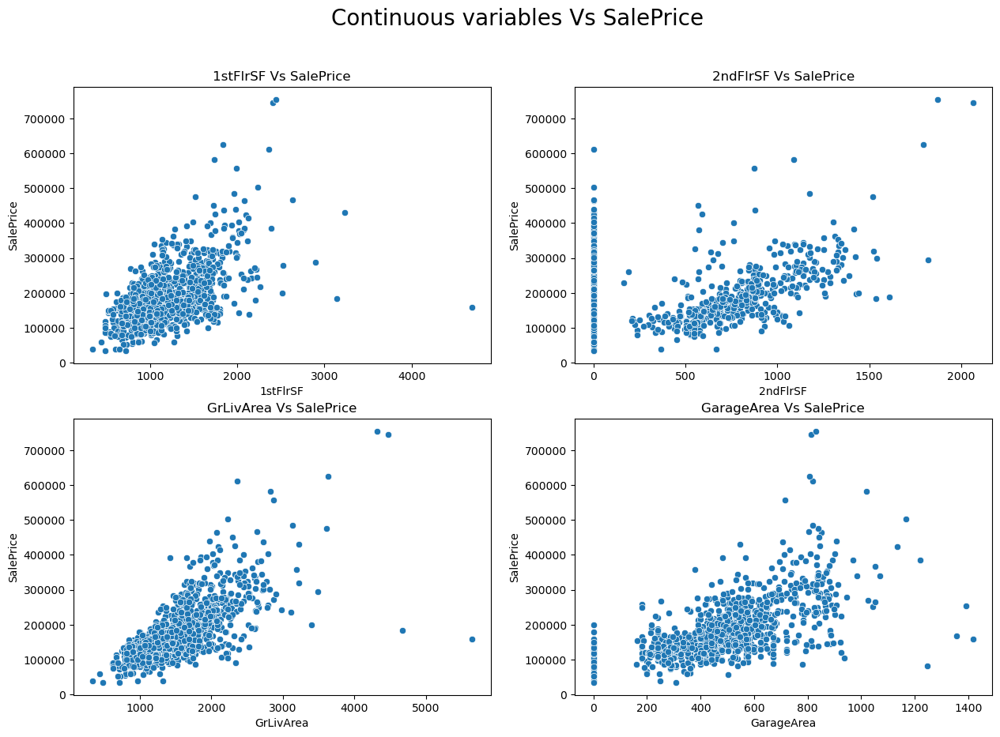

In [40]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('1stFlrSF Vs SalePrice')
sns.scatterplot(x='1stFlrSF',y='SalePrice',data=train_df)

plt.subplot(2,2,2)
plt.title('2ndFlrSF Vs SalePrice')
sns.scatterplot(x='2ndFlrSF',y='SalePrice',data=train_df)

plt.subplot(2,2,3)
plt.title('GrLivArea Vs SalePrice')
sns.scatterplot(x='GrLivArea',y='SalePrice',data=train_df)

plt.subplot(2,2,4)
plt.title('GarageArea Vs SalePrice')
sns.scatterplot(x='GarageArea',y='SalePrice',data=train_df)
plt.show()

**As the values of the variables are increasing, there appears to be an increase in sale price of the houses/properties, thereby implying a somewhat/clear positive linear relationship between them. The sale prices increase with the increase in the square footage of the 1st and 2nd floors, along with a similar trend with the above grade living area and the area of the garage in the house.**

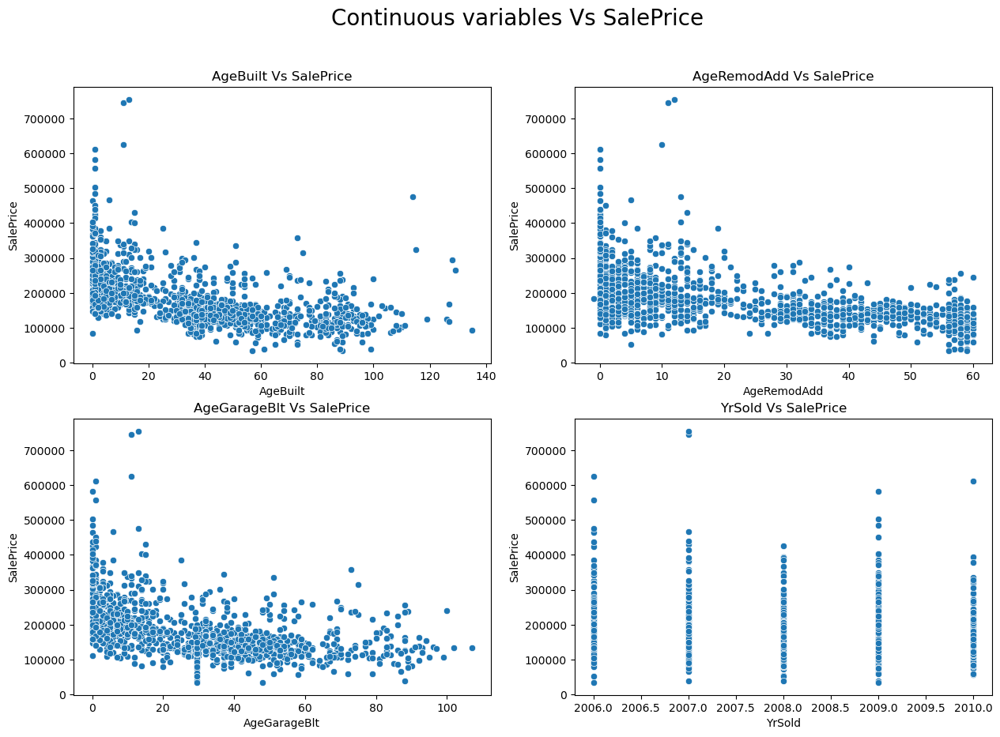

In [42]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('AgeBuilt Vs SalePrice')
sns.scatterplot(x='AgeBuilt',y='SalePrice',data=train_df)

plt.subplot(2,2,2)
plt.title('AgeRemodAdd Vs SalePrice')
sns.scatterplot(x='AgeRemodAdd',y='SalePrice',data=train_df)

plt.subplot(2,2,3)
plt.title('AgeGarageBlt Vs SalePrice')
sns.scatterplot(x='AgeGarageBlt',y='SalePrice',data=train_df)

plt.subplot(2,2,4)
plt.title('YrSold Vs SalePrice')
sns.scatterplot(x='YrSold',y='SalePrice',data=train_df)
plt.show()

**Price appears to be declining as the age variables increase. Year in which a building/property is sold does not seem to have a significant impact on the sale price of the building/property.**

## Data Visualization - Multivariate Analysis

In [43]:
sns.pairplot(train_df)

**This pairplot depicts the pairwise relationship between the columns plotted on the basis of the target variable "SalePrice." The relationship between the features and the label can be seen here.**

**Here, we can see the correlation between the features, and on the diagonal, we can see the distribution plot, which shows whether or not the columns are skew.**

**The linear relationship between the features is also visible.**

## Outlier Check and Removal

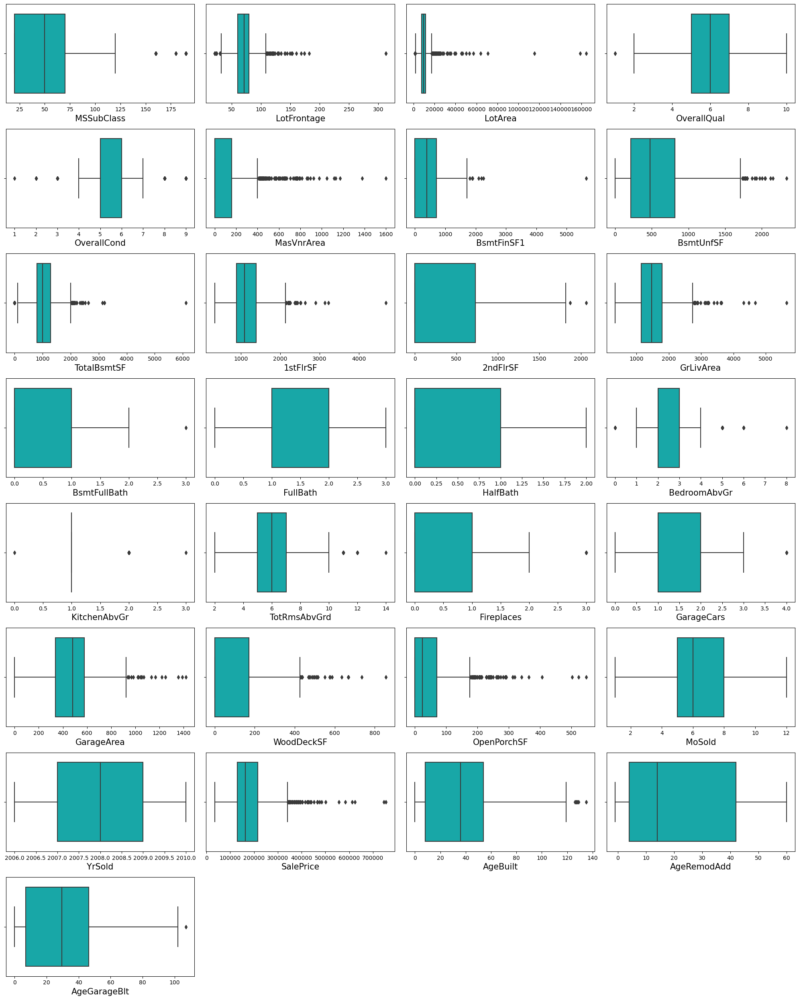

In [44]:
plt.figure(figsize=(20,25))
plotnumber=1
for col in numerical_col:
    if plotnumber<=29:
        ax = plt.subplot(8,4,plotnumber)
        sns.boxplot(train_df[col],color="c")
        plt.xlabel(col,fontsize=15)
    plotnumber+=1
plt.tight_layout()

- Except for FullBath, HalfBath, MoSold, and YrSold, all columns contain outliers.
- Because the columns OverallQual and OverallCond are categorical, and the target variable is 'SalePrice,' we will not remove outliers from these columns.

### Z Score Method

In [47]:
features = train_df[['MSSubClass',
                     'LotFrontage', 
                     'LotArea', 
                     'MasVnrArea', 
                     'BsmtFinSF1',
                     'BsmtUnfSF', 
                     'TotalBsmtSF', 
                     '1stFlrSF', 
                     '2ndFlrSF', 
                     'GrLivArea', 
                     'BsmtFullBath', 
                     'BedroomAbvGr', 
                     'KitchenAbvGr', 
                     'TotRmsAbvGrd', 
                     'Fireplaces', 
                     'GarageCars', 
                     'GarageArea', 
                     'WoodDeckSF', 
                     'OpenPorchSF',
                     'AgeBuilt', 
                     'AgeGarageBlt']]
z=np.abs(zscore(features))
z

array([[1.50830058, 0.        , 0.62061571, ..., 2.38785016, 0.19463567,
        0.0161447 ],
       [0.87704243, 1.07063136, 0.60090318, ..., 2.41799216, 0.00417016,
        0.3049555 ],
       [0.07709478, 0.93686671, 0.06307504, ..., 1.25752521, 0.85732175,
        0.809029  ],
       ...,
       [2.46243779, 2.09513215, 0.91636244, ..., 0.70170469, 0.12836706,
        0.13992076],
       [0.31562908, 0.93583847, 0.22167034, ..., 0.11212927, 1.69401967,
        2.40914844],
       [0.07709478, 0.        , 0.29303823, ..., 0.42862025, 1.08926188,
        1.05658111]])

In [48]:
new_train_df = train_df[(z<3).all(axis=1)]
new_train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemodAdd,AgeGarageBlt
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,958,1078,GasA,TA,Y,SBrkr,958,0,958,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,2007,WD,Normal,128000,31,31,30.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,1043,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,2007,WD,Normal,268000,37,37,37.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,255,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,2007,WD,Normal,269790,11,10,10.0
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,1139,1844,GasA,Ex,Y,SBrkr,1844,0,1844,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,1,2010,COD,Normal,190000,33,33,33.0
4,20,RL,70.98847,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,356,1602,GasA,Gd,Y,SBrkr,1602,0,1602,0,2,0,3,1,Gd,8,Typ,1,TA,Attchd,Fin,2,529,TA,TA,Y,240,0,6,2009,WD,Normal,215000,32,9,32.0


In [49]:
print(train_df.shape)
print(new_train_df.shape)

(1168, 67)
(1003, 67)


In [50]:
loss = (1168-1003)/1168*100
loss

14.126712328767125

**Data Loss is too high**

### IQR

In [51]:
Q1=features.quantile(0.25)
Q3=features.quantile(0.75)

IQR=Q3-Q1
train_df1=train_df[~((train_df<(Q1-1.5*IQR)) |(train_df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [52]:
train_df1.shape

(801, 67)

In [53]:
loss = (1168-801)/1168*100
loss

31.42123287671233

**Data Loss is too high**

### Percentile Method

In [54]:
for col in features:
    if train_df[col].dtypes !='object':
        percentile = train_df[col].quantile([0.01,0.98]).values
        train_df[col][train_df[col]<=percentile[0]]=percentile[0]
        train_df[col][train_df[col]>=percentile[1]]=percentile[1]

In [56]:
train_df.shape

(1168, 67)

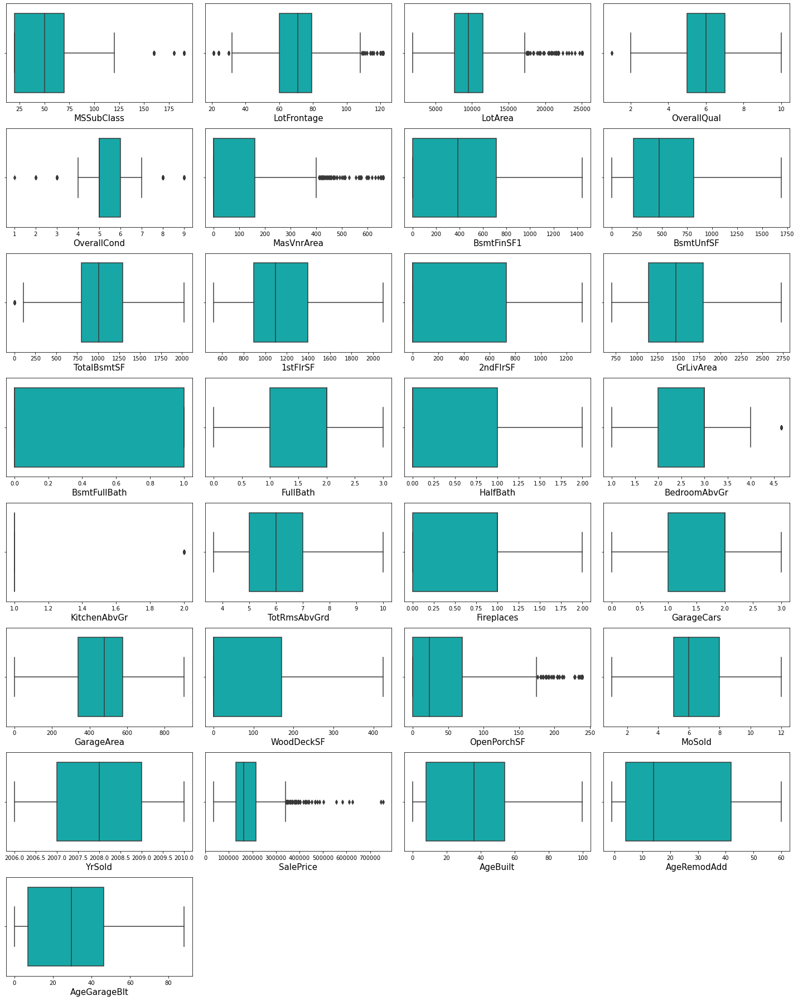

In [57]:
plt.figure(figsize=(20,25))
plotnumber=1
for col in numerical_col:
    if plotnumber<=29:
        ax = plt.subplot(8,4,plotnumber)
        sns.boxplot(train_df[col],color="c")
        plt.xlabel(col,fontsize=15)
    plotnumber+=1
plt.tight_layout()

Most of the outliers have been removed as can be seen above.

## Skewness Check

In [58]:
train_df.skew()

MSSubClass      1.422019
LotFrontage     0.188060
LotArea         1.191912
OverallQual     0.175082
OverallCond     0.580714
MasVnrArea      1.873138
BsmtFinSF1      0.639523
BsmtUnfSF       0.777624
TotalBsmtSF     0.166773
1stFlrSF        0.645842
2ndFlrSF        0.717390
GrLivArea       0.592755
BsmtFullBath    0.355224
FullBath        0.057809
HalfBath        0.656492
BedroomAbvGr   -0.145762
KitchenAbvGr    4.374289
TotRmsAbvGrd    0.443931
Fireplaces      0.552677
GarageCars     -0.434745
GarageArea     -0.135675
WoodDeckSF      1.053617
OpenPorchSF     1.513678
MoSold          0.220979
YrSold          0.115765
SalePrice       1.953878
AgeBuilt        0.469054
AgeRemodAdd     0.495051
AgeGarageBlt    0.598789
dtype: float64

**Skewness outside of +0.5 and -0.5 is present in the following:**
- MSSubClass
- LotArea
- OverallCond
- MasVnrArea
- BsmtFinSF1
- BsmtUnfSF
- 1stFlrSF
- 2ndFlrSF
- GrLivArea
- HalfBath
- KitchenAbvGr
- Fireplaces
- WoodDeckSF
- OpenPorchSF
- AgeGarageBlt

Because OverallCond is a categorical variable and SalePrice is a label, there is no need to remove skewness in these columns. Let's get rid of the skewenss in the remaining columns.

In [60]:
skew1 = ["MSSubClass",
        "LotArea",
        "MasVnrArea",
        "BsmtFinSF1",
        "BsmtUnfSF",
        "1stFlrSF",
        "2ndFlrSF",
        "GrLivArea",
        "HalfBath",
        "KitchenAbvGr",
        "Fireplaces",
        "WoodDeckSF",
        "OpenPorchSF",
        "AgeGarageBlt"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [61]:
train_df[skew1] = scaler.fit_transform(train_df[skew1].values)
train_df[skew1].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,HalfBath,KitchenAbvGr,Fireplaces,WoodDeckSF,OpenPorchSF,AgeGarageBlt
0,1.370435,-1.306083,-0.822896,-0.117054,0.916764,-0.481887,-0.871789,-1.281768,-0.782707,0.0,0.779453,-0.960144,1.423871,0.284279
1,-1.167999,1.356458,-0.822896,0.395541,1.042594,2.082190,-0.871789,1.377184,-0.782707,0.0,0.779453,0.783831,1.428474,0.520844
2,0.490047,0.113089,-0.822896,0.934402,-0.510359,0.048689,1.177246,1.060650,1.268421,0.0,0.779453,1.047285,1.208580,-0.652949
3,-1.167999,0.530989,1.385487,0.803940,1.178365,1.665038,-0.871789,0.775546,-0.782707,0.0,0.779453,-0.960144,1.178672,0.389131
4,-1.167999,1.497522,1.140684,1.189724,-0.230032,1.201931,-0.871789,0.322952,-0.782707,0.0,0.779453,1.139237,-1.062308,0.354804


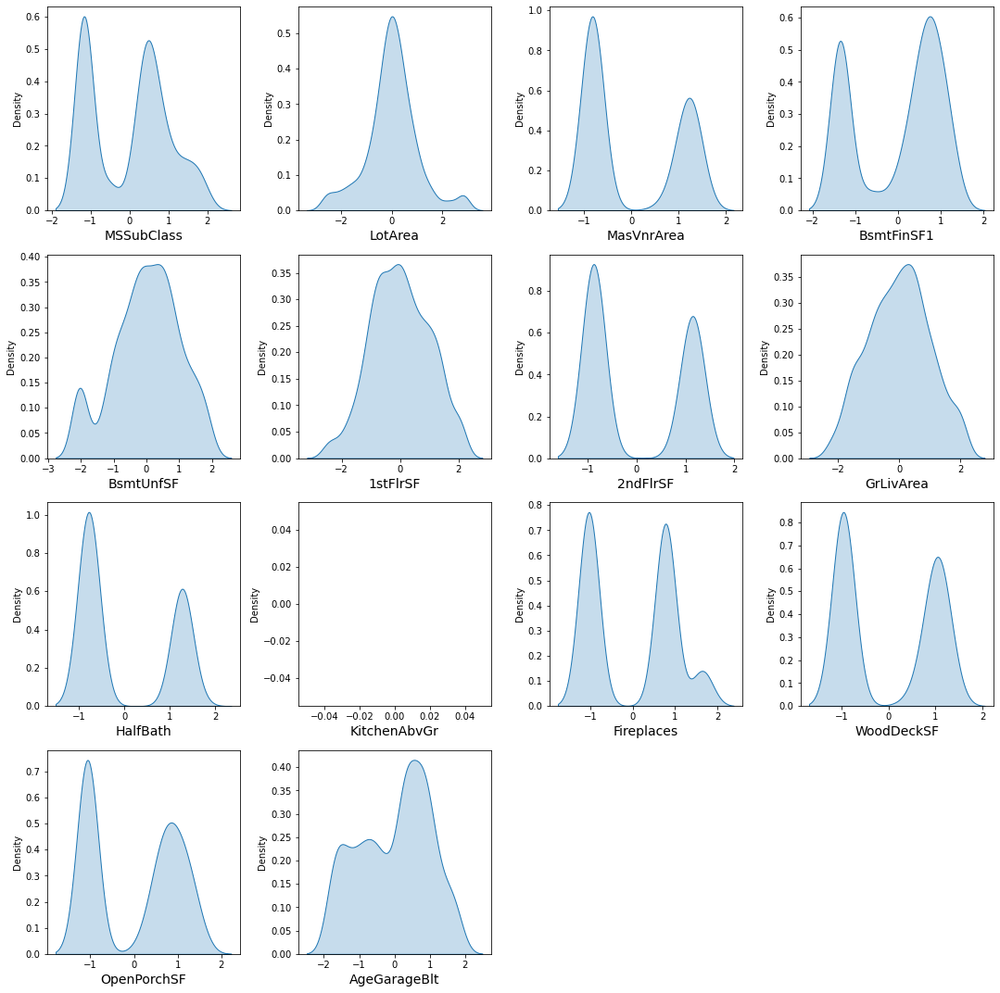

In [62]:
plt.figure(figsize=(15,15))
plotnumber=1
for column in train_df[skew1]:
    if plotnumber<=14:
        ax=plt.subplot(4,4,plotnumber)
        sns.distplot(train_df[column],kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [63]:
train_df[skew1].skew()

MSSubClass      0.064007
LotArea         0.077861
MasVnrArea      0.415092
BsmtFinSF1     -0.418554
BsmtUnfSF      -0.304290
1stFlrSF       -0.000731
2ndFlrSF        0.279883
GrLivArea      -0.005974
HalfBath        0.498003
KitchenAbvGr    0.000000
Fireplaces      0.076595
WoodDeckSF      0.110387
OpenPorchSF    -0.010092
AgeGarageBlt   -0.217611
dtype: float64

**Findings:**
- skeweness has been removed in almost all the columns.
- KitchenAbvGr has zero skewness, implying it contains only one unique value i.e., 0 throughout the dataset. We can drop the column.

In [64]:
train_df.drop("KitchenAbvGr",axis=1,inplace=True)

In [65]:
train_df.shape

(1168, 66)

In [66]:
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemodAdd,AgeGarageBlt
0,1.370435,RL,70.98847,-1.306083,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,-0.822896,TA,TA,CBlock,Gd,TA,No,ALQ,-0.117054,Unf,0.916764,1078.00,GasA,TA,Y,SBrkr,-0.481887,-0.871789,-1.281768,0,2,-0.782707,2.0,TA,5.0,Typ,0.779453,TA,Attchd,RFn,2,440.0,TA,TA,Y,-0.960144,1.423871,2,2007,WD,Normal,128000,31.0,31,0.284279
1,-1.167999,RL,95.00000,1.356458,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,-0.822896,Gd,Gd,PConc,TA,Gd,Gd,ALQ,0.395541,Rec,1.042594,2025.14,GasA,Ex,Y,SBrkr,2.082190,-0.871789,1.377184,1,2,-0.782707,4.0,Gd,8.0,Typ,0.779453,TA,Attchd,Unf,2,621.0,TA,TA,Y,0.783831,1.428474,10,2007,WD,Normal,268000,37.0,37,0.520844
2,0.490047,RL,92.00000,0.113089,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,-0.822896,Gd,TA,PConc,Gd,TA,Av,GLQ,0.934402,Unf,-0.510359,1117.00,GasA,Ex,Y,SBrkr,0.048689,1.177246,1.060650,1,2,1.268421,3.0,TA,8.0,Typ,0.779453,TA,Attchd,Unf,2,455.0,TA,TA,Y,1.047285,1.208580,6,2007,WD,Normal,269790,11.0,10,-0.652949
3,-1.167999,RL,105.00000,0.530989,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,1.385487,TA,TA,CBlock,Gd,TA,No,BLQ,0.803940,Unf,1.178365,1844.00,GasA,Ex,Y,SBrkr,1.665038,-0.871789,0.775546,0,2,-0.782707,3.0,TA,7.0,Typ,0.779453,TA,Attchd,RFn,2,546.0,TA,TA,Y,-0.960144,1.178672,1,2010,COD,Normal,190000,33.0,33,0.389131
4,-1.167999,RL,70.98847,1.497522,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,Gable,CompShg,CemntBd,CmentBd,Stone,1.140684,Gd,TA,CBlock,Gd,TA,No,ALQ,1.189724,Unf,-0.230032,1602.00,GasA,Gd,Y,SBrkr,1.201931,-0.871789,0.322952,0,2,-0.782707,3.0,Gd,8.0,Typ,0.779453,TA,Attchd,Fin,2,529.0,TA,TA,Y,1.139237,-1.062308,6,2009,WD,Normal,215000,32.0,9,0.354804


## Encoding Categorical Variables

In [67]:
column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in column:
    train_df[i] = train_df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [69]:
enc = OrdinalEncoder()
for i in train_df.columns:
    if train_df[i].dtypes == "object":
        train_df[i] = enc.fit_transform(train_df[i].values.reshape(-1,1))

In [70]:
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemodAdd,AgeGarageBlt
0,1.370435,3.0,70.98847,-1.306083,1.0,0.0,3.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1.0,1.0,8.0,9.0,2.0,-0.822896,3,3,1.0,4,3,3.0,0.0,-0.117054,5.0,0.916764,1078.00,1.0,3,1.0,4.0,-0.481887,-0.871789,-1.281768,0,2,-0.782707,2.0,3,5.0,6.0,0.779453,3,1.0,1.0,2,440.0,3,3,2.0,-0.960144,1.423871,2,2007,8.0,4.0,128000,31.0,31,0.284279
1,-1.167999,3.0,95.00000,1.356458,1.0,0.0,3.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,0.0,5.0,12.0,13.0,2.0,-0.822896,4,4,2.0,3,4,1.0,0.0,0.395541,4.0,1.042594,2025.14,1.0,5,1.0,4.0,2.082190,-0.871789,1.377184,1,2,-0.782707,4.0,4,8.0,6.0,0.779453,3,1.0,2.0,2,621.0,3,3,2.0,0.783831,1.428474,10,2007,8.0,4.0,268000,37.0,37,0.520844
2,0.490047,3.0,92.00000,0.113089,1.0,0.0,3.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1.0,1.0,7.0,7.0,2.0,-0.822896,4,3,2.0,4,3,0.0,2.0,0.934402,5.0,-0.510359,1117.00,1.0,5,1.0,4.0,0.048689,1.177246,1.060650,1,2,1.268421,3.0,3,8.0,6.0,0.779453,3,1.0,2.0,2,455.0,3,3,2.0,1.047285,1.208580,6,2007,8.0,4.0,269790,11.0,10,-0.652949
3,-1.167999,3.0,105.00000,0.530989,1.0,0.0,3.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,3.0,1.0,8.0,9.0,1.0,1.385487,3,3,1.0,4,3,3.0,1.0,0.803940,5.0,1.178365,1844.00,1.0,5,1.0,4.0,1.665038,-0.871789,0.775546,0,2,-0.782707,3.0,3,7.0,6.0,0.779453,3,1.0,1.0,2,546.0,3,3,2.0,-0.960144,1.178672,1,2010,0.0,4.0,190000,33.0,33,0.389131
4,-1.167999,3.0,70.98847,1.497522,1.0,0.0,3.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,1.0,1.0,4.0,4.0,3.0,1.140684,4,3,1.0,4,3,3.0,0.0,1.189724,5.0,-0.230032,1602.00,1.0,4,1.0,4.0,1.201931,-0.871789,0.322952,0,2,-0.782707,3.0,4,8.0,6.0,0.779453,3,1.0,0.0,2,529.0,3,3,2.0,1.139237,-1.062308,6,2009,8.0,4.0,215000,32.0,9,0.354804


## Establishing Correlations

In [74]:
corr = train_df.corr()
corr

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemodAdd,AgeGarageBlt
MSSubClass,1.000000,0.026898,-0.316274,-0.312939,-0.017924,0.067516,-0.030467,0.057130,-0.016595,-0.011619,-0.039101,-0.031881,0.586409,0.481353,0.122241,-0.033927,-0.138069,-0.028166,-0.048778,-0.069930,-0.028288,0.004875,0.062077,-0.031109,0.048143,0.076728,-0.006384,-0.060011,0.084234,-0.100436,0.056615,-0.116225,-0.293377,0.071533,0.018161,-0.111572,0.036332,-0.312472,0.558561,0.230677,-0.067705,0.197635,0.295003,0.078793,0.048228,0.192707,0.037758,0.029802,-0.004202,0.104343,-0.023714,0.000675,-0.075152,-0.003808,-0.045967,-0.086870,0.038922,0.062935,0.010865,-0.042020,0.064683,-0.027825,-0.001252,0.005669,-0.055151,-0.058538
MSZoning,0.026898,1.000000,-0.084834,-0.058912,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,0.000913,0.009719,-0.012037,0.005548,-0.033521,-0.037361,-0.160447,0.097907,-0.244844,-0.206193,-0.041842,0.037414,0.021518,-0.036041,-0.031322,-0.032954,-0.065060,0.051188,-0.149446,-0.015887,-0.079205,-0.037611,-0.016193,-0.086858,-0.009900,-0.188837,-0.125164,-0.000610,-0.133170,-0.024508,-0.091684,0.009349,-0.011942,0.125155,0.162566,-0.130963,-0.163414,-0.095053,-0.073200,-0.077280,0.006946,-0.182359,-0.051646,-0.004964,0.079854,0.004501,-0.133221,0.296616,0.174282,0.278292
LotFrontage,-0.316274,-0.084834,1.000000,0.596143,-0.044573,-0.157341,-0.016620,-0.201691,0.023253,0.091671,-0.022579,0.011970,-0.467073,0.057902,0.230687,-0.051887,0.168101,0.063294,0.079942,0.108934,-0.066054,0.166180,0.158712,-0.001004,0.090652,0.163680,0.047333,-0.121117,-0.028977,0.087060,-0.015941,0.130111,0.318263,-0.036713,0.084699,0.087970,0.073880,0.394878,-0.036998,0.318133,0.070859,0.180823,0.049731,0.278173,0.158665,0.323070,0.037977,0.227523,-0.059379,-0.243693,-0.202471,0.297190,0.334422,0.053380,0.039626,0.106891,0.065003,0.168784,0.027718,-0.005074,-0.040647,0.076587,0.358470,-0.129581,-0.081202,-0.072003
LotArea,-0.312939,-0.058912,0.596143,1.000000,-0.072669,-0.287003,-0.074834,-0.198998,0.176280,0.075420,0.069366,0.056741,-0.524128,0.005503,0.190547,0.010314,0.119446,0.220463,0.079181,0.095689,-0.019842,0.076589,0.097839,0.070513,0.009319,0.116129,0.047736,-0.144857,-0.043423,0.119301,-0.073788,0.052521,0.332367,-0.021160,0.047385,0.073866,0.053827,0.452791,0.009290,0.397820,0.108691,0.187219,0.061575,0.297515,0.127004,0.369388,-0.025038,0.328380,-0.096589,-0.201895,-0.155464,0.272560,0.319552,0.060260,0.030388,0.041033,0.125098,0.146222,0.021311,-0.039843,-0.022130,0.046115,0.394343,-0.029530,-0.031184,0.019759
Street,-0.017924,0.140215,-0.044573,-0.072669,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,0.002189,0.001406,-0.013606,0.016793,0.057140,0.031082,-0.006875,0.007889,0.012482,0.014618,0.000822,0.020075,0.091807,-0.028096,0.032701,0.027107,0.002199,0.065253,-0.006420,0.008924,0.045208,0.030988,0.016841,0.006981,0.038560,0.043024,0.038720,0.009913,0.026241,0.052837,-0.010398,0.033208,0.045883,0.028722,0.068306,0.039782,-0.015309,0.021069,-0.027427,-0.000824,-0.001178,0.001838,-0.002976,-0.005942,-0.006471,0.041318,0.022918,0.017900,-0.008860,-0.019635,0.025920,0.014176,0.044753,-0.022127,-0.059127,-0.024426
LotShape,0.067516,0.053655,-0.157341,-0.287003,-0.012941,1.000000,0.081803,0.211395,-0.101187,-0.031852,-0.136885,-0.032926,0.099822

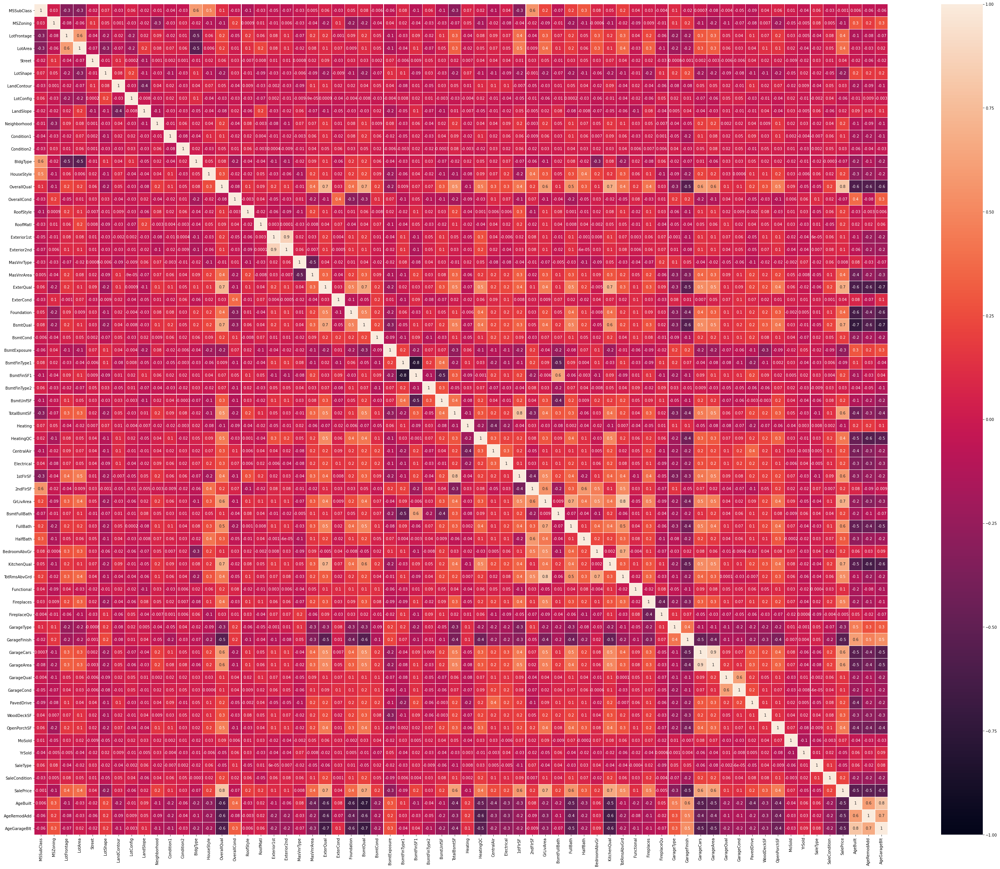

In [75]:
plt.figure(figsize=(50,40))    
sns.heatmap(train_df.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',annot=True)
plt.yticks(rotation=0);

**Darker shades towards the blue/black spectrum reflect strong positive correlation, whereas lighter shades towards the skin tone/white spectrum reflect strong negative correlation with the label.**

In [76]:
corr['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.688210
ExterQual        0.672665
KitchenQual      0.659228
BsmtQual         0.653265
GarageCars       0.634573
GarageArea       0.627504
TotalBsmtSF      0.624311
1stFlrSF         0.575665
FullBath         0.554988
TotRmsAbvGrd     0.528564
Fireplaces       0.475531
OpenPorchSF      0.449961
HeatingQC        0.431516
LotArea          0.394343
Foundation       0.374169
MasVnrArea       0.373364
LotFrontage      0.358470
WoodDeckSF       0.310128
HalfBath         0.309808
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
BsmtFullBath     0.218620
SaleCondition    0.217687
BsmtFinSF1       0.212858
HouseStyle       0.205502
Neighborhood     0.198942
BsmtUnfSF        0.193140
RoofStyle        0.192654
BsmtCond         0.181625
BedroomAbvGr     0.177452
2ndFlrSF         0.167816
RoofMatl         0.159865
GarageQual       0.147272
GarageCond       0.119962
Functional       0.118673
Exterior1st 

**Features with high positive correlation with Sale Price**
- OverallQual
- GrLivArea
- ExterQual
- KitchenQual
- BsmtQual
- GarageCars
- GarageArea
- TotalBsmtSF
- 1stFlrSF
- FullBath
- TotRmsAbvGrd

**Features with high negative correlation with Sale Price**
- LotShape
- BsmtExposure
- GarageType
- AgeRemodAdd
- AgeGarageBlt
- AgeBuilt
- GarageFinish

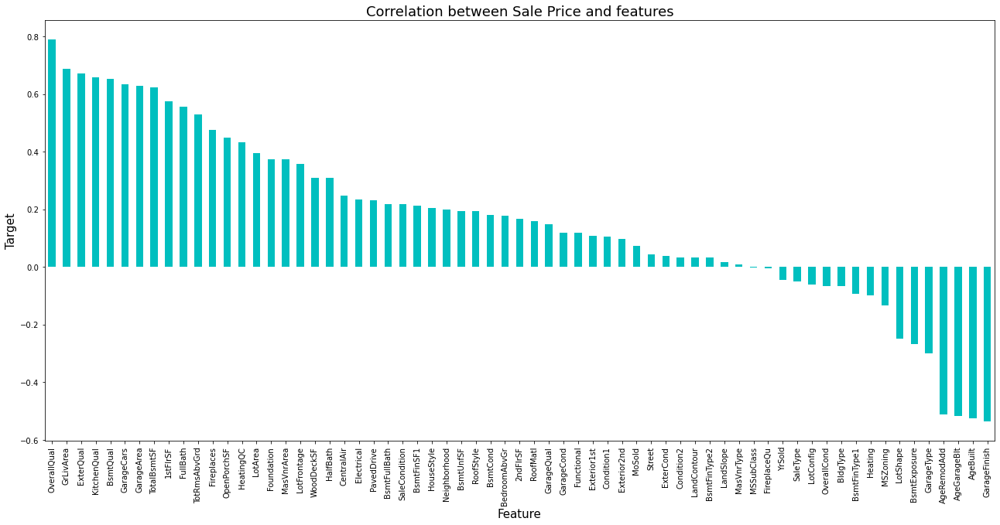

In [77]:
plt.figure(figsize=(22,10))
train_df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('Correlation between Sale Price and features',fontsize=18)
plt.show()

## Distinguishing Features and Label

In [78]:
x = train_df.drop("SalePrice",axis=1)
y = train_df['SalePrice']

In [79]:
x.shape

(1168, 65)

In [80]:
y.shape

(1168,)

## Data Scaling

In [82]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemodAdd,AgeGarageBlt
0,1.370435,-0.021646,0.039092,-1.306083,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,-0.023979,2.985495,-0.549930,-0.075169,-0.530217,-0.483544,-0.134573,-0.212927,-0.104890,0.395209,-0.822896,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,-0.117054,0.310141,0.916764,0.067300,-0.11909,-1.178317,0.267506,0.299036,-0.481887,-0.871789,-1.281768,-0.838227,0.793082,-0.782707,-1.144966,-0.788838,-1.009429,0.261146,0.779453,-1.163409,-0.693653,-0.288773,0.307737,-0.163806,0.101364,0.110393,0.291828,-0.960144,1.423871,-1.617822,-0.605487,0.330033,0.207932,-0.189926,0.382860,0.284279
1,-1.167999,-0.021646,1.321126,1.356458,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.023979,-0.403288,-0.549930,1.364138,0.359572,-1.685203,6.090408,1.079014,1.050880,0.395209,-0.822896,1.032209,2.589114,0.852451,-0.832343,3.332324,-1.113129,-1.523529,0.395541,-0.771186,1.042594,2.453434,-0.11909,0.903792,0.267506,0.299036,2.082190,-0.871789,1.377184,1.192995,0.793082,-0.782707,1.475072,0.716657,0.975397,0.261146,0.779453,-1.163409,-0.693653,0.946709,0.307737,0.717359,0.101364,0.110393,0.291828,0.783831,1.428474,1.361470,-0.605487,0.330033,0.207932,0.013316,0.671675,0.520844
2,0.490047,-0.021646,1.160948,0.113089,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.023979,-0.403288,1.030838,0.644484,-0.530217,-0.483544,-0.134573,-0.535912,-0.682775,0.395209,-0.822896,1.032209,-0.223988,0.852451,0.647378,-0.037507,-1.987463,-0.434828,0.934402,0.310141,-0.510359,0.165553,-0.11909,0.903792,0.267506,0.299036,0.048689,1.177246,1.060650,1.192995,0.793082,1.268421,0.165053,-0.788838,0.975397,0.261146,0.779453,-1.163409,-0.693653,0.946709,0.307737,-0.090782,0.101364,0.110393,0.291828,1.047285,1.208580,-0.128176,-0.605487,0.330033,0.207932,-0.867400,-0.627990,-0.652949
3,-1.167999,-0.021646,1.855050,0.530989,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,0.359572,1.919773,-0.134573,-0.212927,-0.104890,-1.241686,1.385487,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-0.979178,0.803940,0.310141,1.178365,1.997087,-0.11909,0.903792,0.267506,0.299036,1.665038,-0.871789,0.775546,-0.838227,0.793082,-0.782707,0.165053,-0.788838,0.313788,0.261146,0.779453,-1.163409,-0.693653,-0.288773,0.307737,0.352235,0.101364,0.110393,0.291828,-0.960144,1.178672,-1.990233,1.651563,-4.612004,0.207932,-0.122178,0.479132,0.389131
4,-1.167999,-0.021646,0.039092,1.497522,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,1.249361,-0.483544,-0.134573,-1.504868,-1.549602,2.032104,1.140684,1.032209,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,1.189724,0.310141,-0.230032,1.387415,-0.11909,-0.137262,0.267506,0.299036,1.201931,-0.871789,0.322952,-0.838227,0.793082,-0.782707,0.165053,0.716657,0.975397,0.261146,0.779453,-1.163409,-0.693653,-1.524255,0.307737,0.269474,0.101364,0.110393,0.291828,1.139237,-1.062308,-0.128176,0.899213,0.330033,0.207932,-0.156052,-0.676126,0.354804


## Principal Component Analysis (PCA)

In [84]:
cover_matrix=PCA(n_components=len(x.columns))
cover_matrix.fit(x)

PCA(n_components=65)

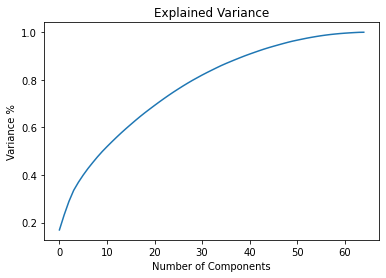

In [90]:
pca = PCA()
pr_comp = pca.fit_transform(x)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance %')
plt.title('Explained Variance')
plt.show()

In [91]:
pc=PCA(n_components=50)
x1=pc.fit_transform(x)
train_df_x=pd.DataFrame(x1)

In [92]:
train_df_x.shape

(1168, 50)

## Model Building

**`Finding best random state`**

In [94]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(train_df_x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.8929439261244873  on Random_state  181


In [95]:
x_train,x_test,y_train,y_test=train_test_split(train_df_x,y,test_size=.30,random_state=maxRS)

In [96]:
lr = LinearRegression()
rf = RandomForestRegressor()
svr = SVR()
dt = DecisionTreeRegressor()

In [97]:
lr.fit(x_train,y_train)
rf.fit(x_train,y_train)
svr.fit(x_train,y_train)
dt.fit(x_train,y_train)

DecisionTreeRegressor()

In [98]:
print("-"*50)
print("Linear Regression Model")
print("-"*50)
lr_pred = lr.predict(x_test)
print("R2 Score: ", r2_score(y_test,lr_pred), "\n")
print("Mean Squared Error: ", mean_squared_error(y_test,lr_pred), "\n"*2)

print("-"*50)
print("Random Forest Model")
print("-"*50)
rf_pred = rf.predict(x_test)
print("R2 Score: ", r2_score(y_test,rf_pred), "\n")
print("Mean Squared Error: ", mean_squared_error(y_test,rf_pred), "\n"*2)

print("-"*50)
print("Support Vector Regression Model")
print("-"*50)
svr_pred = svr.predict(x_test)
print("R2 Score: ", r2_score(y_test,svr_pred), "\n")
print("Mean Squared Error: ", mean_squared_error(y_test,svr_pred), "\n"*2)

print("-"*50)
print("Decision Tree Model")
print("-"*50)
dt_pred = dt.predict(x_test)
print("R2 Score: ", r2_score(y_test,dt_pred), "\n")
print("Mean Squared Error: ", mean_squared_error(y_test,dt_pred), "\n"*2)

--------------------------------------------------
Linear Regression Model
--------------------------------------------------
R2 Score:  0.841111736679627 

Mean Squared Error:  955107746.7852867 


--------------------------------------------------
Random Forest Model
--------------------------------------------------
R2 Score:  0.8936454816430158 

Mean Squared Error:  639317355.8927604 


--------------------------------------------------
Support Vector Regression Model
--------------------------------------------------
R2 Score:  -0.07869205387757017 

Mean Squared Error:  6484224294.004828 


--------------------------------------------------
Decision Tree Model
--------------------------------------------------
R2 Score:  0.6050881181639713 

Mean Squared Error:  2373890869.954416 




**Based on the R2 score, Random Forest appears to be the best model.**

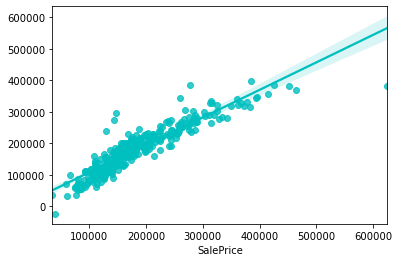

In [99]:
sns.regplot(y_test,lr_pred,color='c')
plt.show()

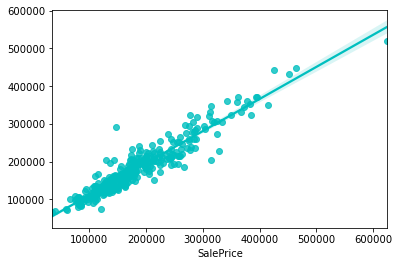

In [100]:
sns.regplot(y_test,rf_pred,color='c')
plt.show()

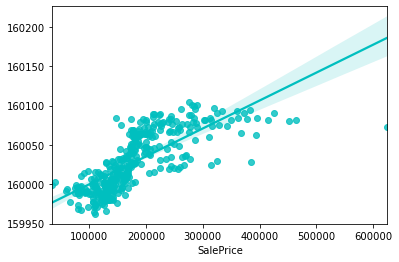

In [101]:
sns.regplot(y_test,svr_pred,color='c')
plt.show()

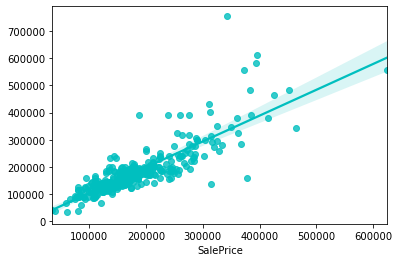

In [102]:
sns.regplot(y_test,dt_pred,color='c')
plt.show()

In [103]:
print("Cross Validation Score for Linear Regression Model: ", cross_val_score(lr,train_df_x,y,cv=5).mean(), "\n"*2)
print("Cross Validation Score for Random Forest Model: ", cross_val_score(rf,train_df_x,y,cv=5).mean(), "\n"*2)
print("Cross Validation Score for Support Vector Regression Model: ", cross_val_score(svr,train_df_x,y,cv=5).mean(), "\n"*2)
print("Cross Validation Score for Decision Tree Model: ", cross_val_score(dt,train_df_x,y,cv=5).mean())

Cross Validation Score for Linear Regression Model:  0.8010670703560805 


Cross Validation Score for Random Forest Model:  0.8283693628416016 


Cross Validation Score for Support Vector Regression Model:  -0.06166040986855133 


Cross Validation Score for Decision Tree Model:  0.638444191216726


#### It appears `Random Forest` is the best model for our prediction.

## Hyperparameter Tuning

In [104]:
parameters = {'n_estimators':[10,50,100],
              'max_depth':[10,20,30],
              'max_features':['auto','sqrt'],
              'min_samples_leaf': [2, 3, 5],
              'min_samples_split': [2, 5, 8]
             }

In [105]:
GCV = GridSearchCV(RandomForestRegressor(),parameters,cv=5)

In [106]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [10, 20, 30],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [2, 3, 5],
                         'min_samples_split': [2, 5, 8],
                         'n_estimators': [10, 50, 100]})

In [107]:
GCV.best_params_

{'max_depth': 10,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 8,
 'n_estimators': 50}

In [108]:
Final_model = RandomForestRegressor(max_depth=10, max_features='auto', min_samples_leaf=2, min_samples_split=8, n_estimators=50)
Final_model.fit(x_train,y_train)
pred = Final_model.predict(x_test)
print('R2_Score:',r2_score(y_test,pred)*100)
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('MAE:',metrics.mean_absolute_error(y_test, pred))
print('MSE:',metrics.mean_squared_error(y_test, pred))

R2_Score: 89.35081751912671
RMSE value: 25301.04209793543
MAE: 17860.601375220773
MSE: 640142731.2415009


## Saving and reloading the model for prediction

In [109]:
joblib.dump(Final_model,'Housing_Price_Prediction.pkl')

['Housing_Price_Prediction.pkl']

In [111]:
Model = joblib.load("Housing_Price_Prediction.pkl")

a = np.array(y_test)
predicted = np.array(Model.predict(x_test))
df_train_pred = pd.DataFrame({"Original":a,"Predicted":predicted},index= range(len(a)))
df_train_pred

,Original,Predicted
0,100000,109015.597245
1,85400,98976.106122
2,187500,211748.803968
3,145000,163036.925662
4,168500,173266.785154
5,237500,215243.305337
6,176500,190072.967187
7,157000,151898.789048
8,113000,116895.375859
9,155000,140852.264231


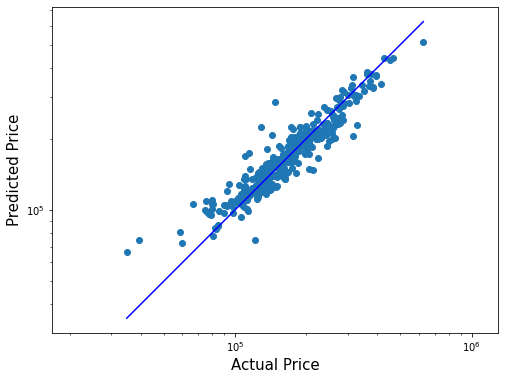

In [112]:
plt.figure(figsize=(8,6))
plt.scatter(y_test, predicted)
plt.yscale('log')
plt.xscale('log')
p1 = max(max(predicted), max(y_test))
p2 = min(min(predicted), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual Price', fontsize=15)
plt.ylabel('Predicted Price', fontsize=15)
plt.axis('equal')
plt.show()

# `2. Test Dataset`

## Preparing the test data for prediction

In [136]:
test_df = pd.read_csv("test.csv")
test_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

In [137]:
test_df.shape

(292, 80)

In [138]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [139]:
test_df.nunique().to_frame("Unique Values")

,Unique Values
Id,292
MSSubClass,15
MSZoning,4
LotFrontage,65
LotArea,249
Street,2
Alley,2
LotShape,4
LandContour,4
Utilities,2


In [140]:
test_df.drop("Id",axis=1,inplace=True)
test_df.drop("Utilities",axis=1,inplace=True)

In [141]:
test_df.drop(columns = ['PoolArea',
                         '3SsnPorch',
                         'EnclosedPorch',
                         'LowQualFinSF',
                         'MiscVal',
                         'BsmtFinSF2',
                         'ScreenPorch',
                         'BsmtHalfBath'],inplace=True)

In [142]:
test_df['AgeBuilt'] = test_df.YrSold-test_df.YearBuilt
test_df['AgeRemodAdd'] = test_df.YrSold-test_df.YearRemodAdd
test_df['AgeGarageBlt'] = test_df.YrSold-test_df.GarageYrBlt

In [143]:
test_df.drop("YearBuilt",axis=1,inplace=True)
test_df.drop("YearRemodAdd",axis=1,inplace=True)
test_df.drop("GarageYrBlt",axis=1,inplace=True)

In [144]:
test_df.drop(['PoolQC','MiscFeature','Alley','Fence'],axis=1,inplace=True)

In [145]:
col1 = test_df.columns.values
for i in range(0,len(col1)):
    if test_df[col1[i]].dtype == "object":
        test_df[col1[i]].fillna(test_df[col1[i]].mode()[0],inplace=True)

In [146]:
col2 = test_df.columns.values
for i in range(0,len(col2)):
    if test_df[col2[i]].dtype != 'object':
        test_df[col2[i]].fillna(test_df[col2[i]].mean(),inplace=True)

In [147]:
train_df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageCars       0
GarageArea  

In [148]:
categorical_col = []
for i in test_df.dtypes.index:
    if test_df.dtypes[i] == 'object':
        categorical_col.append(i)
print("Categorical columns are :",categorical_col)

Categorical columns are : ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [149]:
numerical_col = []
for i in test_df.dtypes.index:
    if test_df.dtypes[i] != 'object':
        numerical_col.append(i)
print("Categorical columns are :",numerical_col)

Categorical columns are : ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'AgeBuilt', 'AgeRemodAdd', 'AgeGarageBlt']


In [150]:
test_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,AgeBuilt,AgeRemodAdd,AgeGarageBlt
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000
mean,57.414384,66.425101,10645.143836,6.078767,5.493151,109.171821,439.294521,557.315068,1042.767123,1133.691781,339.657534,1477.051370,0.424658,1.575342,0.359589,2.794521,1.05137,6.417808,0.595890,1.729452,457.458904,86.397260,47.061644,6.232877,2007.859589,35.243151,22.565068,28.090909
std,43.780649,19.975962,13330.669795,1.356147,1.063267,174.729023,429.559675,411.043768,424.561153,366.941919,424.278825,514.199429,0.508831,0.547856,0.494795,0.807336,0.23616,1.728105,0.621259,0.754430,210.785591,121.898836,65.865449,2.774556,1.322867,30.494309,20.089470,23.145196
min,20.000000,21.000000,1526.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,0.000000,0.000000
25%,20.000000,57.750000,7200.000000,5.000000,5.000000,0.000000,0.000000,255.000000,771.750000,858.000000,0.000000,1061.500000,0.000000,1.000000,0.000000,2.000000,1.00000,5.000000,0.000000,1.000000,300.000000,0.000000,0.000000,4.000000,2007.000000,6.750000,4.000000,6.000000
50%,50.000000,66.425101,9200.000000,6.000000,5.000000,0.000000,369.500000,487.000000,971.000000,1047.500000,0.000000,1440.000000,0.000000,2.000000,0.000000,3.000000,1.00000,6.000000,1.000000,2.000000,467.500000,0.000000,28.500000,6.000000,2008.000000,32.000000,14.000000,28.090909
75%,70.000000,76.000000,11658.750000,7.000000,6.000000,180.000000,700.500000,780.000000,1322.000000,1370.500000,717.000000,1720.250000,1.000000,2.000000,1.000000,3.000000,1.00000,7.000000,1.000000,2.000000,569.750000,149.250000,66.000000,8.000000,2009.000000,53.250000,39.250000,42.000000
max,190.000000,150.000000,215245.000000,10.000000,9.000000,1031.000000,1767.000000,1935.000000,3094.000000,2402.000000,1589.000000,3447.000000,2.000000,3.000000,2.000000,6.000000,3.00000,12.000000,2.000000,4.000000,1052.000000,728.000000,418.000000,12.000000,2010.000000,136.000000,60.000000,90.000000


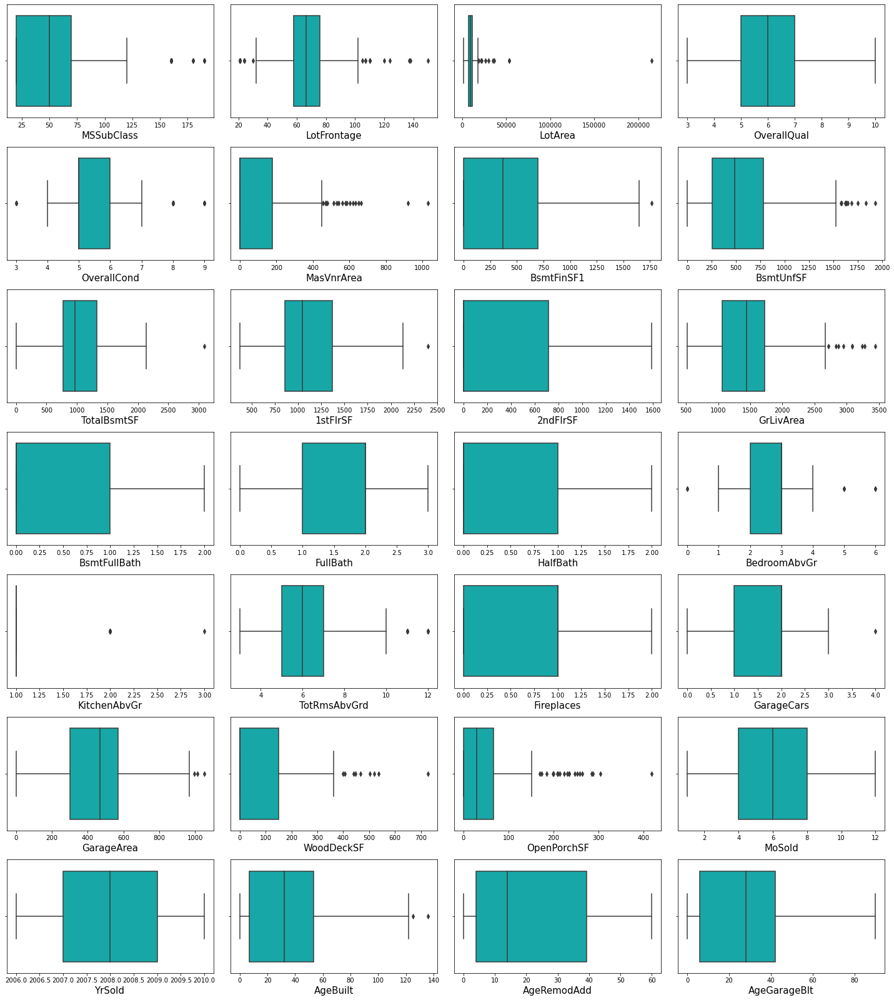

In [151]:
plt.figure(figsize=(20,25))
plotnumber=1
for col in numerical_col:
    if plotnumber<=29:
        ax = plt.subplot(8,4,plotnumber)
        sns.boxplot(test_df[col],color="c")
        plt.xlabel(col,fontsize=15)
    plotnumber+=1
plt.tight_layout()

In [152]:
for col in features:
    if test_df[col].dtypes !='object':
        percentile = test_df[col].quantile([0.01,0.98]).values
        test_df[col][test_df[col]<=percentile[0]]=percentile[0]
        test_df[col][test_df[col]>=percentile[1]]=percentile[1]

In [153]:
test_df.skew()

MSSubClass      1.323471
LotFrontage    -0.017005
LotArea         1.266527
OverallQual     0.397312
OverallCond     1.209714
MasVnrArea      1.545675
BsmtFinSF1      0.639990
BsmtUnfSF       0.873375
TotalBsmtSF     0.149160
1stFlrSF        0.596239
2ndFlrSF        0.689956
GrLivArea       0.790479
BsmtFullBath    0.335025
FullBath       -0.049800
HalfBath        0.758892
BedroomAbvGr   -0.345731
KitchenAbvGr    4.253608
TotRmsAbvGrd    0.627431
Fireplaces      0.540164
GarageCars     -0.356072
GarageArea      0.051450
WoodDeckSF      1.317908
OpenPorchSF     1.790292
MoSold          0.186504
YrSold          0.018412
AgeBuilt        0.623131
AgeRemodAdd     0.533693
AgeGarageBlt    0.652207
dtype: float64

**Skewness outside of +0.5 and -0.5 is present in the following:**
- MSSubClass
- LotArea
- OverallCond
- MasVnrArea
- BsmtFinSF1
- BsmtUnfSF
- 1stFlrSF
- 2ndFlrSF
- GrLivArea
- HalfBath
- KitchenAbvGr
- TotRmsAbvGrd
- Fireplaces
- WoodDeckSF
- OpenPorchSF
- AgeBuilt
- AgeRemodAdd
- AgeGarageBlt

In [154]:
skew1 = ["MSSubClass",
        "LotArea",
        "MasVnrArea",
        "BsmtFinSF1",
        "BsmtUnfSF",
        "1stFlrSF",
        "2ndFlrSF",
        "GrLivArea",
        "HalfBath",
        "KitchenAbvGr",
        "Fireplaces",
        "WoodDeckSF",
        "OpenPorchSF",
        "AgeGarageBlt",
        "TotRmsAbvGrd",
        "AgeBuilt",
        "AgeRemodAdd"]

scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [155]:
test_df[skew1] = scaler.fit_transform(test_df[skew1].values)
test_df[skew1].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,HalfBath,KitchenAbvGr,Fireplaces,WoodDeckSF,OpenPorchSF,AgeGarageBlt,TotRmsAbvGrd,AgeBuilt,AgeRemodAdd
0,-1.149822,1.012372,1.184649,1.212776,0.459512,1.831025,-0.870332,0.966245,-0.738058,0.0,0.808861,1.121289,0.720332,-1.398672,0.981907,-1.417238,-1.445667
1,1.341197,-0.878055,-0.846660,1.071176,-0.847801,0.748588,-0.870332,-0.083846,-0.738058,0.0,0.808861,0.815051,-1.112306,0.158835,-1.613568,-0.008559,0.451735
2,-1.149822,0.565525,-0.846660,-1.376632,1.999450,1.606536,-0.870332,0.744611,-0.738058,0.0,0.808861,1.156129,1.287751,-0.765124,0.449228,-0.830966,-0.489875
3,0.706032,0.598156,-0.846660,0.235999,-0.094676,-0.717217,1.138156,0.337234,1.349285,0.0,0.808861,-0.913781,-1.112306,1.412209,0.449228,1.066994,1.403199
4,0.507373,1.092887,0.953962,-1.376632,0.880166,-0.591803,1.212102,0.983798,1.349285,0.0,0.808861,0.955750,0.216312,-1.572963,1.463878,-1.583151,-1.445667


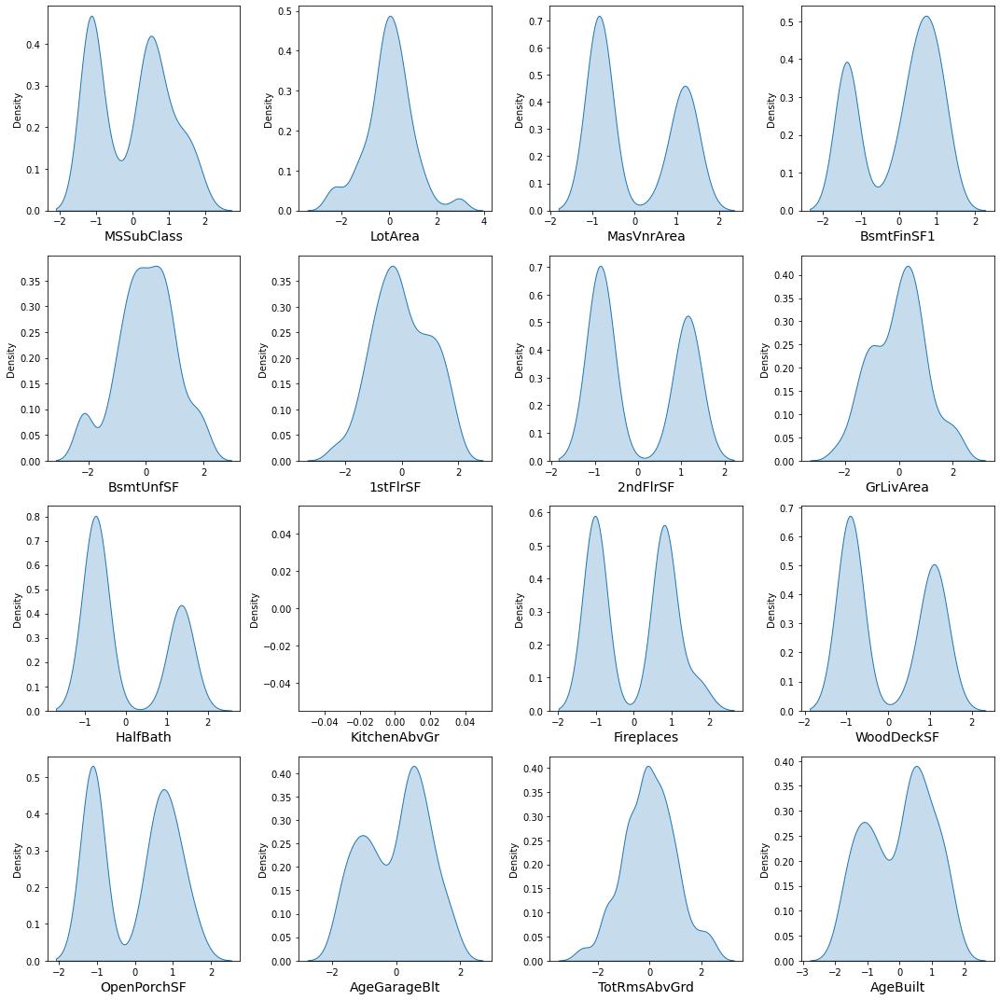

In [159]:
plt.figure(figsize=(15,15))
plotnumber=1
for column in test_df[skew1]:
    if plotnumber<=16:
        ax=plt.subplot(4,4,plotnumber)
        sns.distplot(test_df[column],kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [160]:
test_df[skew1].skew()

MSSubClass      0.088585
LotArea         0.075717
MasVnrArea      0.362294
BsmtFinSF1     -0.447437
BsmtUnfSF      -0.247815
1stFlrSF        0.003835
2ndFlrSF        0.283971
GrLivArea      -0.003046
HalfBath        0.621093
KitchenAbvGr    0.000000
Fireplaces      0.076669
WoodDeckSF      0.208541
OpenPorchSF    -0.065103
AgeGarageBlt   -0.189437
TotRmsAbvGrd    0.000698
AgeBuilt       -0.190514
AgeRemodAdd    -0.140395
dtype: float64

In [161]:
test_df.drop("KitchenAbvGr",axis=1,inplace=True)

In [162]:
column_test = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in column_test:
    test_df[i] = test_df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [163]:
enc = OrdinalEncoder()
for i in test_df.columns:
    if test_df[i].dtypes == "object":
        test_df[i] = enc.fit_transform(test_df[i].values.reshape(-1,1))

In [164]:
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemodAdd,AgeGarageBlt
0,-1.149822,2.0,86.000000,1.012372,1.0,0.0,1.0,0.0,0.0,21.0,2.0,0.0,0.0,2.0,9,5,3.0,0.0,9.0,11.0,3.0,1.184649,4,3,2.0,5,3,1.0,2.0,1.212776,5.0,0.459512,1922.0,0.0,5,1.0,3.0,1.831025,-0.870332,0.966245,1,2,-0.738058,3,4,0.981907,5.0,0.808861,4,1.0,0.0,3,676.0,3,3,2.0,1.121289,0.720332,7,2007,5.0,2.0,-1.417238,-1.445667,-1.398672
1,1.341197,2.0,66.425101,-0.878055,1.0,0.0,3.0,1.0,0.0,21.0,2.0,0.0,4.0,2.0,8,5,1.0,0.0,5.0,5.0,2.0,-0.846660,4,3,1.0,4,3,0.0,2.0,1.071176,5.0,-0.847801,1220.0,0.0,4,1.0,3.0,0.748588,-0.870332,-0.083846,1,1,-0.738058,1,4,-1.613568,5.0,0.808861,5,1.0,1.0,2,565.0,3,3,2.0,0.815051,-1.112306,8,2009,0.0,0.0,-0.008559,0.451735,0.158835
2,-1.149822,2.0,66.425101,0.565525,1.0,3.0,3.0,4.0,0.0,4.0,2.0,0.0,0.0,2.0,8,5,3.0,0.0,9.0,11.0,2.0,-0.846660,4,3,2.0,4,3,0.0,5.0,-1.376632,5.0,1.999450,1753.0,0.0,5,1.0,3.0,1.606536,-0.870332,0.744611,0,2,-0.738058,3,5,0.449228,5.0,0.808861,3,1.0,1.0,2,522.0,3,3,2.0,1.156129,1.287751,6,2009,5.0,2.0,-0.830966,-0.489875,-0.765124
3,0.706032,2.0,75.000000,0.598156,1.0,3.0,0.0,4.0,0.0,5.0,2.0,0.0,0.0,5.0,7,7,1.0,0.0,6.0,7.0,2.0,-0.846660,3,3,1.0,3,3,3.0,4.0,0.235999,5.0,-0.094676,704.0,0.0,5,1.0,3.0,-0.717217,1.138156,0.337234,0,1,1.349285,3,2,0.449228,5.0,0.808861,4,1.0,2.0,1,234.0,3,3,2.0,-0.913781,-1.112306,7,2009,5.0,2.0,1.066994,1.403199,1.412209
4,0.507373,2.0,86.000000,1.092887,1.0,0.0,3.0,1.0,0.0,20.0,1.0,0.0,0.0,5.0,6,5,1.0,0.0,9.0,11.0,3.0,0.953962,4,3,2.0,4,3,2.0,5.0,-1.376632,5.0,0.880166,894.0,0.0,5,1.0,3.0,-0.591803,1.212102,0.983798,0,2,1.349285,4,4,1.463878,5.0,0.808861,4,3.0,0.0,3,668.0,3,3,2.0,0.955750,0.216312,1,2008,5.0,2.0,-1.583151,-1.445667,-1.572963


In [165]:
test_df.shape

(292, 65)

In [166]:
corr_test = test_df.corr()
corr_test

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemodAdd,AgeGarageBlt
MSSubClass,1.000000,0.230922,-0.373908,-0.387652,0.005665,0.126507,0.013631,0.013514,-0.062158,-0.093560,0.060330,-0.028565,0.641508,0.499602,-0.068933,-0.034187,-0.243385,-0.003546,-0.029276,-0.118860,-0.108053,0.000174,-0.044504,-0.081128,0.055058,0.070922,0.040575,-0.027770,0.096357,-0.147265,0.064315,-0.146880,-0.382049,0.043193,-0.070985,-0.066447,0.060709,-0.392687,0.593936,0.176972,-0.063898,0.148119,0.345263,0.030151,-0.134077,0.100772,-0.070135,-0.003696,-0.105648,0.167402,0.018028,-0.053219,-0.089616,0.008007,-0.016228,-0.018566,0.066206,-0.083760,0.027774,0.022935,-0.090847,-0.043731,0.009205,0.072494,-0.039320
MSZoning,0.230922,1.000000,-0.351480,-0.334747,-0.063162,0.167716,-0.099137,0.055261,-0.035312,-0.204984,-0.059909,0.105995,0.230251,-0.068366,-0.276394,0.191126,-0.031210,-0.022604,-0.028611,-0.028994,0.010358,-0.125284,-0.327079,0.065494,-0.195382,-0.219848,-0.139784,0.050552,0.038716,-0.139954,-0.015825,-0.139829,-0.279128,0.094397,-0.225763,-0.235065,-0.035888,-0.222821,0.017349,-0.209589,-0.083104,-0.236326,-0.181873,-0.120083,-0.266916,-0.150258,-0.131738,-0.169600,0.050584,0.142661,0.233188,-0.308576,-0.307001,-0.087401,-0.067022,-0.236680,-0.101952,-0.186630,0.074308,-0.072716,0.123993,0.005290,0.350378,0.181582,0.281610
LotFrontage,-0.373908,-0.351480,1.000000,0.588692,-0.062040,-0.137329,-0.062143,-0.128053,0.121853,0.190659,0.063261,-0.018847,-0.455486,-0.069730,0.270539,-0.105705,0.195909,0.084083,0.050653,0.058110,0.046939,0.130875,0.198226,-0.076662,0.147518,0.173670,0.047516,-0.113060,0.008967,0.089147,-0.093740,0.170756,0.382534,-0.011848,0.112876,0.028364,0.014873,0.458030,-0.077241,0.353087,0.062089,0.219694,0.039841,0.247313,0.181581,0.331847,0.034426,0.253007,-0.009986,-0.240542,-0.315188,0.331935,0.349266,0.061087,0.034276,0.075489,0.027836,0.077141,-0.040921,0.053027,0.032145,0.036364,-0.165926,-0.093082,-0.139225
LotArea,-0.387652,-0.334747,0.588692,1.000000,-0.115787,-0.314092,-0.132902,-0.159049,0.389047,0.167866,0.070621,-0.042893,-0.567474,-0.045095,0.222532,-0.105291,0.238122,0.036748,0.070773,0.072612,-0.022629,0.097522,0.191309,-0.025702,0.087793,0.128584,0.042430,-0.190761,0.006961,0.142195,0.001046,0.119309,0.402904,0.016274,0.069721,0.081991,0.006613,0.489937,-0.020609,0.425677,0.112235,0.225790,0.116572,0.348570,0.160187,0.412069,0.043733,0.310479,0.022905,-0.211720,-0.261185,0.361897,0.374366,0.032976,-0.036598,-0.023073,0.125369,0.157970,-0.062967,0.000591,0.071355,0.062657,-0.101061,-0.076171,-0.071859
Street,0.005665,-0.063162,-0.062040,-0.115787,1.000000,-0.002444,0.153613,0.058229,-0.324146,-0.045972,-0.246714,0.004868,-0.028820,0.043073,0.066173,0.077702,-0.054925,0.006540,-0.021532,-0.019729,0.036783,-0.015087,0.128016,0.024868,0.043091,0.009123,0.003768,0.099047,-0.037657,-0.038769,0.110019,0.095220,-0.032170,0.011782,0.060962,0.156680,-0.025961,-0.013159,0.072277,0.051220,-0.098030,0.087362,-0.025380,0.031874,0.058313,0.068524,-0.018670,-0.027697,0.033426,0.006743,-0.029487,-0.086271,-0.106612,-0.006540,-0.007318,-0.023367,-0.002458,-0.019054,0.036965,-0.040272,-0.019125,-0.012345,-0.048795,-0.090541,-0.070435
LotShape,0.126507,0.167716,-0.137329,-0.314092,-0.002444,1.000000,0.100105,0.262901,-0.094606,-0.067832,-0.022692,-0.082226,0.178101,-0.056015,-0.193911,-0.041775,0.064795,0.

In [169]:
scaler = StandardScaler()
test_df = pd.DataFrame(scaler.fit_transform(test_df), columns=test_df.columns)
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemodAdd,AgeGarageBlt
0,-1.149822,-0.287006,1.067625,1.012372,0.083045,-1.402669,-2.566101,-2.001106,-0.226274,1.554460,-0.028763,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.846195,-0.078757,0.694397,0.733065,1.952161,1.184649,1.137790,-0.299447,0.776109,2.077301,-0.045376,-1.192678,-0.377559,1.212776,0.296045,0.459512,2.183107,-0.141879,0.842032,0.248633,0.312609,1.831025,-0.870332,0.966245,1.180442,0.776457,-0.738058,0.307995,0.816613,0.981907,0.22482,0.808861,0.487877,-0.659455,-1.474589,1.709952,1.058663,0.078757,0.088121,0.281378,1.121289,0.720332,0.276960,-0.650908,0.23029,0.148654,-1.417238,-1.445667,-1.398672
1,1.341197,-0.287006,0.021774,-0.878055,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.554460,-0.028763,-0.058621,2.722077,-0.518671,1.419117,-0.464603,-0.523427,-0.078757,-1.046066,-1.248926,0.355435,-0.846660,1.137790,-0.299447,-0.518884,0.619196,-0.045376,-2.090260,-0.377559,1.071176,0.296045,-0.847801,0.451512,-0.141879,-0.208709,0.248633,0.312609,0.748588,-0.870332,-0.083846,1.180442,-1.051974,-0.738058,-2.459219,0.816613,-1.613568,0.22482,0.808861,2.268630,-0.659455,-0.254816,0.367732,0.523823,0.078757,0.088121,0.281378,0.815051,-1.112306,0.637997,0.863555,-6.49418,-3.323909,-0.008559,0.451735,0.158835
2,-1.149822,-0.287006,0.021774,0.565525,0.083045,0.745474,0.299297,0.598774,-0.226274,-1.281387,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,1.846195,-0.078757,0.694397,0.733065,0.355435,-0.846660,1.137790,-0.299447,0.776109,0.619196,-0.045376,-2.090260,1.284459,-1.376632,0.296045,1.999450,1.766241,-0.141879,0.842032,0.248633,0.312609,1.606536,-0.870332,0.744611,-0.847141,0.776457,-0.738058,0.307995,2.335408,0.449228,0.22482,0.808861,-1.292875,-0.659455,-0.254816,0.367732,0.316633,0.078757,0.088121,0.281378,1.156129,1.287751,-0.084077,0.863555,0.23029,0.148654,-0.830966,-0.489875,-0.765124
3,0.706032,-0.287006,0.479915,0.598156,0.083045,0.745474,-3.998799,0.598774,-0.226274,-1.114572,-0.028763,-0.058621,-0.444642,1.011146,0.680468,1.419621,-0.523427,-0.078757,-0.610950,-0.588262,0.355435,-0.846660,-0.648418,-0.299447,-0.518884,-0.838910,-0.045376,0.602487,0.730453,0.235999,0.296045,-0.094676,-0.821285,-0.141879,0.842032,0.248633,0.312609,-0.717217,1.138156,0.337234,-0.847141,-1.051974,1.349285,0.307995,-2.220978,0.449228,0.22482,0.808861,0.487877,-0.659455,0.964957,-0.974489,-1.071060,0.078757,0.088121,0.281378,-0.913781,-1.112306,0.276960,0.863555,0.23029,0.148654,1.066994,1.403199,1.412209
4,0.507373,-0.287006,1.067625,1.092887,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.387645,-1.228602,-0.058621,-0.444642,1.011146,-0.058181,-0.464603,-0.523427,-0.078757,0.694397,0.733065,1.952161,0.953962,1.137790,-0.299447,0.776109,0.619196,-0.045376,-0.295096,1.284459,-1.376632,0.296045,0.880166,-0.352619,-0.141879,0.842032,0.248633,0.312609,-0.591803,1.212102,0.983798,-0.847141,0.776457,1.349285,1.691601,0.816613,1.463878,0.22482,0.808861,0.487877,0.497067,-1.474589,1.709952,1.020116,0.078757,0.088121,0.281378,0.955750,0.216312,-1.889261,0.106324,0.23029,0.148654,-1.583151,-1.445667,-1.572963


In [170]:
cover_matrix=PCA(n_components=len(test_df.columns))
cover_matrix.fit(test_df)

PCA(n_components=65)

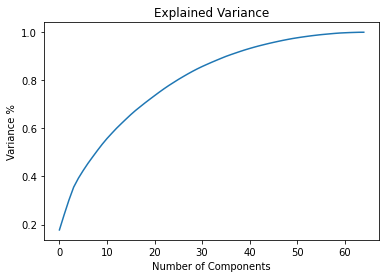

In [171]:
pca = PCA()
pr_comp = pca.fit_transform(test_df)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance %')
plt.title('Explained Variance')
plt.show()

In [172]:
pc=PCA(n_components=50)
x1=pc.fit_transform(test_df)
test_df_x=pd.DataFrame(x1)

In [173]:
test_df_x.shape

(292, 50)

In [174]:
test_df_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
0,6.706751,2.448502,-1.280314,1.558234,0.685198,0.334981,0.864933,-0.822992,0.801203,-0.260212,-1.014879,-1.087161,0.845007,-0.495712,-0.191688,-0.583702,0.185939,0.708023,0.255558,0.271001,1.372438,1.347288,0.882298,-0.048940,-0.326946,-0.596326,-0.142938,-0.404087,-0.183968,-0.650260,0.182151,-1.310597,0.559961,-0.028876,0.203724,-0.843236,0.268008,-0.291980,0.559982,0.209531,0.526261,-0.685565,0.427844,0.221829,0.413886,0.556234,0.484420,-0.428213,-0.738150,0.544261
1,0.796999,3.136732,2.471310,-1.329808,1.294607,-4.709077,2.237830,0.368660,3.338633,3.992170,-1.616648,-0.940966,2.859567,1.442154,0.111845,-0.803067,0.066614,-0.760351,0.405455,-1.535129,1.075297,0.628881,-0.163375,1.260292,-1.294114,-0.205713,-0.816023,0.420772,-0.482153,-1.264656,-0.630140,0.328458,-0.627258,0.925097,-0.945691,0.994368,-0.107014,-0.165611,-0.117002,-0.814040,-0.838456,0.974112,-0.011710,-0.919451,0.001223,-0.197669,-0.515961,0.402437,0.468141,-0.622589
2,4.186932,0.064677,-0.742693,2.878554,-0.153944,-1.074076,-0.022090,0.011462,-1.145974,-1.254913,-0.730417,1.632746,0.134278,0.919019,0.237087,0.165566,0.285646,-0.391533,0.262943,-0.431546,0.337745,-0.701849,-0.745140,-0.307894,-0.456278,1.354534,2.062462,0.311327,0.570363,-0.112580,0.025867,-0.805683,0.193868,-0.695356,0.852405,0.077970,0.997691,0.039702,-0.980701,-0.071597,-0.305839,0.244548,-1.071444,-0.611207,0.418825,-0.462330,-0.893888,0.204149,0.189893,0.197962
3,-2.794172,-1.908702,-1.652635,-1.183959,-1.451374,1.199564,0.542073,-0.825335,0.045608,0.196200,-0.820943,-0.067683,-0.220885,-0.554806,1.554806,0.596705,0.361440,0.930743,1.349061,-0.812211,-0.293044,0.006647,0.863678,1.493101,-0.725289,-1.159616,0.236283,0.386139,-0.099812,-2.608320,2.095759,-0.905844,0.365666,0.266606,0.306334,0.542280,1.039290,-0.791921,0.493664,-0.986918,-0.197231,-0.104759,0.173765,-0.810344,-0.040108,0.843564,0.857323,-0.228722,0.377635,0.077759
4,4.445690,-3.287315,-0.476386,0.857903,-0.375667,0.454402,0.649191,0.893692,1.794555,0.955114,-0.028246,-0.270180,-0.241876,-1.145494,0.313289,0.407198,0.560043,0.291804,0.357211,0.608514,0.622216,0.137909,0.490091,-2.400784,0.451441,0.323582,-0.435074,0.287895,-0.518961,0.464632,-0.291498,-0.704970,0.762892,-0.266542,-0.734931,-0.328199,-0.764603,-0.176475,-0.896352,-0.163269,-0.240751,-0.307652,1.401053,1.234399,0.604400,-0.024918,0.557535,0.461834,-0.211614,0.078505


In [176]:
Predicted_SalePrice = Model.predict(test_df_x)
Predicted_SalePrice

array([ 88381.17192435, 160058.43285549, 120212.32237472, 224234.24577044,
       116523.37357737, 291520.40389333, 151281.5611777 ,  97341.89988678,
       122512.99968783, 152371.12414346, 451607.08062432, 200163.23993805,
       236524.58937982, 161911.79397544, 100554.96121745, 230038.20279692,
       216788.95690916, 225549.3371486 , 147759.19582529, 133365.99427773,
       232824.21664382, 169036.94123804, 177123.39311267, 349587.51120391,
       321992.95863178, 204336.72916293, 151853.30104825, 186608.37018056,
       167530.42756589, 323706.01293615, 186697.89726678, 133305.67271978,
       112515.76314598, 185674.66075697, 307267.08115945, 158495.78548591,
       135866.0660097 , 238226.13760934, 175034.82563125, 189737.93425097,
       286855.86763801, 109662.95319037, 124996.71421288, 129738.47673121,
       156386.01139408, 263379.77405433, 241737.33464284, 350582.12542028,
       116084.73007995,  80161.6046937 , 203065.24153448, 140722.34002365,
       283836.5018865 , 4

In [177]:
Prediction = pd.DataFrame()
Prediction['SalePrice'] = Predicted_SalePrice
Prediction

,SalePrice
0,88381.171924
1,160058.432855
2,120212.322375
3,224234.245770
4,116523.373577
5,291520.403893
6,151281.561178
7,97341.899887
8,122512.999688
9,152371.124143


In [178]:
Prediction.to_csv("Predicted_House_SalePrice.csv")

# Conclusion

## Which variables are important to predict the price of the house?

Overall quality is the most important and has the greatest positive impact. Furthermore, features such as GarageArea, LotArea, 1stFlrSF, TotalBsmtSF, and so on have a somewhat linear relationship with the price variable.

## How do these variables describe the price of the house?

- Houses with very high overall quality, such as material and finish, have a high sale price. Also, we can see from the plot that as the overall quality of the house improves, so does the sale price. That is, there is a strong linear relationship between the SalePrice and the OverallQual. As a result, if the seller constructs the house with these qualities in mind, the house's sale price will rise.

- The SalePrice and 1stFlrSF have a linear relationship. As we can see, as the size of the first floor increases, so does the price. As a result, people prefer to live in houses with only 1-2 floors, and the cost of the house rises as a result.

- We've also seen a positive linear relationship between the SalePrice and the GarageArea. As the size of the garage increases, so does the sale price.

- There is positive linear relation between sale price and TotalBsmtSF. As total basement area increases, sale price also increases.

- We have built many ML models using features that have some relationship with the target and have seen an increase in the accuracy of the best model.

# `END`